<a href="https://colab.research.google.com/github/zhengyangchoong/cy2003-cellcounting/blob/cell_counting/cellcounting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Cell-Counting Model Iterations for CY2003 Project — Automated Cell-Counting Microscope 2021

## Introduction

This notebook captures the key versions the team cycled through and allows you to try out the code for yourself. Take note that you should change the image directory paths and use your own microscope images. For information on the Flask application and autofocusing algorithm, visit our [GitHub repository](https://github.com/zhengyangchoong/cy2003-cellcounting).

# Let's Mount your Google Drive so you can access your files and use them later!

In [ ]:
# Mount Google Drive for Google Colab access

from google.colab import drive
drive.mount('/content/gdrive')
import os
print(os.getcwd())

Mounted at /content/gdrive
/content


# V1: Template Matching 

The prototyping log and thought process behind this version can be found [here](https://blogs.ntu.edu.sg/ps9888-2021-g18/2021/07/23/template-matching/).

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal

In [ ]:
def main():
	img = cv2.imread('IMG_3173.jpg', 0) # 0 is greyscale; there's probably a way to use RGB data to fix the artifacts near the edge but it's not a priority yet

	print(img.shape)

	_height, _width = img.shape

	radius = 750 

	img_c = img[_height//2-radius:_height//2+radius, _width//2 - radius: _width//2 + radius]

	img_c = cv2.medianBlur(img_c, 3)

	img_c = ~img_c

	img_c[img_c < 55] = 0 # threshold derived by looking a a histogram

	cv2.imwrite("IMG_3173_preproc.jpg", img_c)

	#plt.imshow(img_c)
	#plt.show()

main()

def distance(x1, x2):
	# x1 and x2 are each tuples

	return np.sqrt((x1[0] - x2[0])**2 + (x1[1] - x2[1])**2)


def bin_coords(position):

	binned = []
	bin_radius = 10


	# naive binning, assumes input is alr sorted

	for coord in zip(*position[::-1]):
		#print(coord)
		new_bin = False

		if len(binned) == 0:
			binned.append(coord)
			continue

		if all([distance(existing_coord, coord) > bin_radius for existing_coord in binned]):
			binned.append(coord)

	return binned



def template():

	img = cv2.imread('cells_4_noise_0.jpg', 0)
	#img = img.astype('float64') * 255/np.max(img)

	template = cv2.imread('template.jpg', 0)
	#template = template.astype('float64') * 255/np.max(template)
	width, height = template.shape[::-1]

	match = cv2.matchTemplate(img, template, cv2.TM_CCOEFF_NORMED)

	threshold = 0.5 # just lower if needed lol

	position = np.where(match >= threshold)

	print(position)

	binned = bin_coords(position)

	for point in binned:
		cv2.rectangle(img, point, (point[0] + width, point[1] + height), 255, 2)


	# for point in zip(*position[::-1]): #draw the rectangle around the matched template

	cv2.imshow('Template Found', img)
	cv2.waitKey(0)


def count():

	img = cv2.imread('cells_4_noise_0.jpg', 0)

	img = img.astype('float64') * 255/np.max(img)
	

	heatmap = np.zeros((img.shape[0], img.shape[1]))

	print(img.shape)

	win_size = 30 # 30x30 square
	step_size = 15

	data = []

	for c, i in enumerate(range(0, img.shape[0] - win_size + 1, step_size)):
		for d, j in enumerate(range(0, img.shape[1] - win_size + 1, step_size)):
			data.append(np.sum(img[i:i+win_size, j:j+win_size]))

	data = np.array(data)
	data = data/(win_size**2)

	plt.hist(data)
	plt.show()

	data = data.reshape((c + 1,d + 1))

	plt.imshow(data)
	plt.show()

template()

# Synthetic Dataset Generation

The prototyping log and thought process behind this can be found [here](https://blogs.ntu.edu.sg/ps9888-2021-g18/2021/07/23/synthetic-dataset/).

## V1 Synthetic Dataset Generation 

*   Use original cell images as template cell types
*   Use background from original cell image
*   Randomly select from template cell types
*   Randomly place cells on background and mash together

The prototyping log and thought process behind this can be found [here](https://blogs.ntu.edu.sg/ps9888-2021-g18/2021/07/23/synthetic-dataset/).


In [ ]:
import pandas as pd
import numpy as np
import os

import cv2

import matplotlib.pyplot as plt

from skimage.io import imread, imshow
from skimage.transform import resize
import random

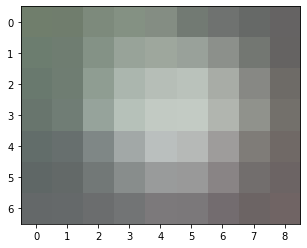

In [ ]:
# current no of cell types: 22 (deprecated) // 11 (current webcam)
number = 3
# take samples from original images to generate unique cell types 
sample_path = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/original_images/'
sample = cv2.imread(sample_path + str(number) + '.png')
plt.imshow(sample)

# known coordinates for cropping exact cell

y=2
x=33
h=7
w=9

# use numpy slicing to execute the crop
img = sample[y:y+h, x:x+w]
#cv2.imwrite(sample_path + f'cropped/{str(number)}.png', img)
cv2.imwrite(sample_path + f'cropped/11.png', img)
plt.imshow(img)

True

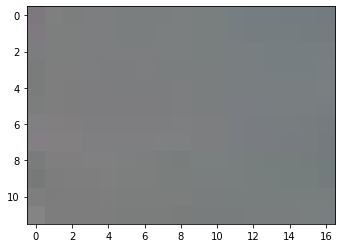

In [ ]:
# crop out background
# does it matter if the background is less than 40 x 40??? // see how
sample_path = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/original_images/'
fname = '1.png'

# known coordinates for background
y = 40
x = 38
h = 50
w = 50

image = cv2.imread(sample_path + fname)
plt.imshow(image)
bground = image[y:y+h, x:x+w].copy()
plt.imshow(bground)

#cv2.imwrite(sample_path + 'background_' +  fname, bground)

In [ ]:
# create noise images if want to add noise to synthetic images? // todo maybe

True


In [ ]:
# overlap_check then random generating new number get more and more inefficient as more coordinates are added to the dict
# store range in set/ list, remove range of value when used, pick from set/list for future cell additions
# problem what if [1,2,3,4,5,38,39,56,58] -> pick 38 -> need to check if cell width is accomodated -> reject if not cndkslnknv
# use sets!!! issubset // blog content


def insert_cell(cell_type, bground, x_coordinates, y_coordinates, counting):
            """ 
            Insert a cell of specified cell type into background image and removes cell coordinates from sets of coordinates for tracking.

            @param cell_type: cell type from given template cells, 
            @param bground: image background for cells to be pasted on,
            @param x_coordinates: set of x coordinates that have not been occupied by previous cells inserted,
            @param y_coordinates: set of y coordinates that have not been occupied by previous cells inserted
            @return bground: updated background with cell inserted
            @return x_coordinate: updated set of x coordinates with current cell x-coordinates removed
            @return y_coordinate: updated set of y coordinates with current cell y-coordinates removed
            """

            cell = cv2.imread(f'/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/original_images/cropped/{str(cell_type)}.png')

            # add a random rotation to the cell
            cell = np.rot90(cell, k=np.random.randint(0,3))

            shape = cell.shape

            x= random.choice(tuple(x_coordinates))
            y= random.choice(tuple(y_coordinates))
            h=shape[0]
            w=shape[1]

            # check if coordinates are available or occupied by previous cells
            cur_x = {i for i in range(x, x+w+1)}
            cur_y = {i for i in range(y, y+h+1)}
    
            while not (cur_x.issubset(x_coordinates) and cur_y.issubset(y_coordinates)):
              x= random.choice(tuple(x_coordinates))
              y= random.choice(tuple(y_coordinates))
              cur_x = {i for i in range(x, x+w+1)}
              cur_y = {i for i in range(y, y+h+1)}
            print('Out of loop ' + str(counting))
            counting += 1
            x_coordinates -= cur_x
            y_coordinates -= cur_y

            bground[y:y+h, x:x+w] = 0
            bground[y:y+h, x:x+w] = cell
            return bground, x_coordinates, y_coordinates

def partition (total_images, cell_classes):
    #print(list(map(list,partition(range(300),4))))
    return (total_images[int(_*len(total_images)/cell_classes+0.5):int((_+1)*len(total_images)/cell_classes+0.5)] for _ in range(cell_classes))

In [ ]:
# generate artificial images
# tested 300 for 1,2,3 cells without facing bottleneck but need to do 4 cells in batches of 10? if you get lucky 40 works without a hitch
# just rerun cell if 10 images of 4 cells doesn't finish in 1 sec
# TODO add counter or sth so while loop doesn't hang in insert_cell function if unable to find satisfactory coordinates
# probably should just resize bground larger but already did 1,2,3 cell otherwise ratio of cell to bground off for 4 cell
""" 
Variables for customisation
job_name : CSV and part of image name
even_split: If True, num_images_wanted split evenly across min-max cells specified 
            Else random split (Work in progress bleh)
            For example, 900 images wanted of 2-4 cells == 300 each of 2,3,4 cells
csv_dir: Where CSV will be saved
"""
job_name = '16julywebcam' # what csv will be named

num_images_wanted = 8

# even_split = True

min_cells_on_image = 60
max_cells_on_image = 100

# set max x and y to prevent cells from extending outside the bachground image i.e.
# if the get place too close to the edge.
max_x = 1500
max_y = 1500

# store filename and cell count for csv making
filename = []
n_cells = []
csv_dir = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/'

"""# split generation of dataset evenly
if even_split:
    split = list(map(list,partition(range(num_images_wanted),1+ max_cells_on_image - min_cells_on_image))) 
    count = 0 
    for i in range(min_cells_on_image, max_cells_on_image +1):
      split[count][0:0] = [i]
      count += 1"""

# ==============================

for i in range(0, num_images_wanted):
    # randomly choose the number of cells to put in the image
    num_cells_on_image = np.random.randint(min_cells_on_image, max_cells_on_image+1)

    
    # Name the image.
    # The number of cells is included in the file name.
    image_name = job_name + '_' + str(i) + '_'  + str(num_cells_on_image) + '.png'
    
    
    # =========================
    # 1. Create the background
    # =========================

    path = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/original_images/background_1.png'

    # read the image
    bground_comb = cv2.imread(path)

    # add random rotation to the background
    num_k = np.random.randint(0,3)
    bground_comb = np.rot90(bground_comb, k=num_k)

    # resize the background to match what we want
    bground_comb = cv2.resize(bground_comb, (1600, 1600))
    
    
    # ===============================
    # 2. Add cells to the background
    # ===============================
    # store coordinates to handle overlap
    x_coordinates = {i for i in range(0,max_x)}
    y_coordinates = {i for i in range(0, max_y)}
    
    for j in range(0, num_cells_on_image):
        
        path = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/original_images/background_1.png'

        # read the image
        bground = cv2.imread(path)
        # add rotation to the background
        bground = np.rot90(bground, k=num_k)
        # resize the background to match what we want
        bground = cv2.resize(bground, (1600, 1600))
        
        
        # randomly choose a type of cell to add to the image
        cell_type = np.random.randint(1,11+1)

        # insert cell template in image and update set with leftover coordinates
        bground, x_coordinates, y_coordinates = insert_cell(cell_type, bground, x_coordinates, y_coordinates,j+1)

        bground_comb = np.maximum(bground_comb, bground)

    plt.imshow(bground_comb)
    path = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/8july_webcam/' + image_name
    filename.append(image_name)
    n_cells.append(str(num_cells_on_image))
    #bground_comb = cv2.resize(bground_comb, (74, 74))
    cv2.imwrite(path, bground_comb)

df = pd.DataFrame({
     'filename': filename,
     'n_cells': n_cells
    })
print(df)
print(csv_dir+ '{}.csv'.format(job_name))
#df.to_csv(csv_dir+ '{}.csv'.format(job_name), index = False)
    
"""    
    # =============================================
    # 3. Add noise and artifacts to the background
    # =============================================
     
    # We will only add 3 noise items to each image
    for k in range(0, 3):
        
        path = 'base_dir/bground_dir/bground_1.png'

        # read the image
        bground = cv2.imread(path)
        # add rotation to the background
        bground = np.rot90(bground, k=num_k)
        # resize the background to match what we want
        bground = cv2.resize(bground, (1600, 1200))
        
        
        # randomly choose a type of cell to add to the image
        noise_type = np.random.randint(1,3+1)
        

        if noise_type == 1:
            
            # cell_1 path
            noise_1 = cv2.imread('base_dir/noise_dir/noise_1.png')

            # add a random rotation to the cell
            noise_1 = np.rot90(noise_1, k=np.random.randint(0,3))
            
            # get the shape after rotation
            shape = noise_1.shape
            
            # get a random x-coord
            y=np.random.randint(0, max_y)
            # get a random y-coord
            x=np.random.randint(0, max_x)
            # set the width and height
            h=shape[0]
            w=shape[1]
            
            # add the cell to the background
            bground[y:y+h, x:x+w] = 0
            bground[y:y+h, x:x+w] = noise_1


        if noise_type == 2:
            
            noise_2 = cv2.imread('base_dir/noise_dir/noise_2.png')

            # add a random rotation to the cell
            noise_2 = np.rot90(noise_2, k=np.random.randint(0,3))

            shape = noise_2.shape

            y=np.random.randint(0,max_y)
            x=np.random.randint(0,max_x)
            h=shape[0]
            w=shape[1]

            bground[y:y+h, x:x+w] = 0
            bground[y:y+h, x:x+w] = noise_2


        if noise_type == 3:
            
            # noise_3

            noise_3 = cv2.imread('base_dir/noise_dir/noise_3.png')

            # add a random rotation to the cell
            noise_3 = np.rot90(noise_3, k=np.random.randint(0,3))

            shape = noise_3.shape

            y=np.random.randint(0,max_y)
            x=np.random.randint(0,max_x)
            h=shape[0]
            w=shape[1]

            bground[y:y+h, x:x+w] = 0
            bground[y:y+h, x:x+w] = noise_3
        
        bground_comb = np.minimum(bground_comb, bground)"""
    
    
    
    # ===============================
    # 3. Save the image
    # ===============================

        
    
print('Number of synthetic images created: ', num_images_wanted)

In [ ]:
import glob
# concatenate all the csvs tgt
df = pd.concat(map(pd.read_csv, glob.glob('/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/*.csv')))
df.to_csv('/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/20jun_300x0n1n2n3n4cells.csv', index = False)

In [ ]:
# move images in bulk 
import os, shutil

data_dir = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/noiseless1/'
dest = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/noiseless/'
cell_images = [f for f in os.listdir(data_dir) if f.endswith('.png')]
print(len(cell_images))
for image in cell_images:
  shutil.move(data_dir + image, dest)

print('Done!')

1500
Done!


## V2 Synthetic Dataset 
* Use H x W array instead of sets to handle possible coordinate overlaps. Result in increased ability to pack more cells.
* Mock real unfocused images better by randomly adding blur filters to cells inserted.
* Reduced number of lines of code.

The prototyping log and thought process behind this can be found [here](https://blogs.ntu.edu.sg/ps9888-2021-g18/2021/07/23/synthetic-dataset/).

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import copy



def new_insert(N_min, N_max, dim = (1600, 1600)):
  """
  N_min and N_max: max no. of cells
  """

  mask = np.zeros(dim)

  N_cells = np.random.randint(N_min, N_max + 1)

  bg_path = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/original_images/background_1.png'

  image = cv2.imread(bg_path)

  image = np.rot90(image, k = np.random.randint(1,4))

  image = cv2.resize(image, dim)

  bg = copy.deepcopy(image)

  c = 0
  attempt_c = 0
  MAX_ATTEMPTS = 25

  while c < N_cells:

    cell = cv2.imread(f'/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/original_images/cropped/{np.random.randint(1,12)}.png') # choose from 11 cell types

    # randomly blur and reduce opacity -- larger kernel size, larger extent of blurring
    if (np.random.randint(0,2)) and attempt_c < 2:
      cell = cv2.medianBlur(cell,7)

    test_x = np.random.randint(0, dim[1] - cell.shape[1]) # i think numpy arrays behave like this? but we're using squares so whatever
    test_y = np.random.randint(0, dim[0] - cell.shape[0])

    #print(cell.shape)

    if np.sum(mask[test_y: test_y + cell.shape[0], test_x: test_x + cell.shape[1]]) == 0: 
      c += 1
      attempt_c = 0

      mask[test_y: test_y + cell.shape[0], test_x: test_x + cell.shape[1]] = 1
      image[test_y: test_y + cell.shape[0], test_x: test_x + cell.shape[1]] = np.maximum(cell, bg[:cell.shape[0],:cell.shape[1]])
    else:
      attempt_c += 1 # count as failed attempt
    if attempt_c >= MAX_ATTEMPTS: # avoid infinite loop if unsuccessful for ___ times
      break
  return N_cells, image


job_name = "20july_webcam"
N_images = 10

for i in range(N_images):
  _N, test_image = new_insert(100, 500, (600,600))

  cv2.imwrite(os.path.join(f'/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/{job_name}/medianBlur7', f"{job_name}_{i}_{_N}.png"), test_image)


# HDF5 Maker

* Compress training images and CSVs with cell count labels to a hdf5 to reduce loading time when fed to Deep Learning Model.

In [ ]:
import h5py
import pandas as pd
import cv2
import numpy as np
import os
from pathlib import Path
import matplotlib.pyplot as plt


def make_hdf5():

	df = pd.read_csv('/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/20jun_300x0n1n2n3n4cells.csv') 

	output_hdf5 = "/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/21jun_300x0n1n2n3n4cells.hdf5"

	all_files = ([str(p) for p in Path("/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/noiseless/").glob("*.png")])

	hf = h5py.File(output_hdf5, 'w')

	for filename in all_files:
		_filename = (filename.split("/")[-1])

		#if df.loc[df['filename'] == _filename, 'n_cells'].iloc[0] > 2:
		#	continue # exclude images with >2 cells
		_img = cv2.imread(filename, 0) # greyscale model 
		_img = cv2.resize(_img, dsize=(40, 40), interpolation=cv2.INTER_CUBIC)
		_img = cv2.normalize(_img, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
		_img = _img.astype("float32") / 255.0
		_img = _img.reshape(_img.shape + (1,))

		_g = hf.create_dataset(_filename, (40,40, 1), data = _img)

	# read csvs

	hf.close()
make_hdf5()

# df.loc[df['filename'] == '3cut0_0.png', 'n_cells'].iloc[0]

# V2: Deep Learning (Multiclass Classification with CNN)

The prototyping log and the thought process behind this version can be found [here](https://blogs.ntu.edu.sg/ps9888-2021-g18/2021/07/23/deep-learning-multiclass-classification-with-cnn/).

## Image Preprocessing ( Preparing Datasets)



*   Convert HEIC to png // Extract frames from video
*   Crop and apply blurs
*  Prepare CSVs for training datasets (labelling)
*   Resize according to model needs (265 x 256 // 96 x 96)



In [ ]:
# Libraries to install first
!pip install pyheif

     |████████████████████████████████| 8.2MB 4.5MB/s 


In [ ]:
#@title Extract images from HEIC or Video { display-mode: "both" }
input_format = "picture" #@param ["picture", "video"]

if input_format == "picture":
  """Convert HEIC to png"""
  import pyheif
  from PIL import Image
  import os
  import matplotlib.pyplot as plt


  # Retrieve images from CY2003 MnT drive (Add folder as shortcut in My Drive)
  data_dir = '/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/'
  cell_images = [f for f in os.listdir(data_dir+'pictures') if f.endswith('.HEIC')]
  count = 0
  for img in cell_images:
    count += 1
    print(count)
    heif_file = pyheif.read(data_dir+ 'pictures/'+img)
    image = Image.frombytes(
      heif_file.mode, 
      heif_file.size, 
      heif_file.data,
      "raw",
      heif_file.mode,
      heif_file.stride,
      )
    image.save( '/content/gdrive/MyDrive/CY2003_MnT/training_data/12jun_cut/heic_to_png/'+ str(count) + ".png", "PNG")
else:
  import cv2
  from google.colab.patches import cv2_imshow
  #Extracts frames from multiple videos and save as jpg
  data_dir = '/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/'
  cell_videos = [f for f in os.listdir(data_dir+'videos') if f.endswith('.mp4')]

  def extract_multiple_videos(intput_filenames):
      """Extract video files into sequence of images.
         Intput_filenames is a list for video file names"""

      count = 1  # Counter of first video

      # Iterate file names:
      for intput_filename in intput_filenames:
          print(intput_filename)
          cap = cv2.VideoCapture(intput_filename)
  
          # Keep iterating break
          while True:
              ret, frame = cap.read()  # Read frame from first video
  
              if ret:
                  cv2.imwrite('/content/gdrive/MyDrive/cy2003_cellcounting/training_dataset/'+ str(count) + + '.jpg', frame)  # Write frame to JPEG file (1.jpg, 2.jpg, ...)
                  #cv2_imshow(frame)  # Display frame for testing
                  count += 1 # Advance file counter
              else:
                  # Break the internal loop when res status is False.
                  break
  
              cv2.waitKey(100) #Wait 100msec (for debugging)
  
          cap.release() #Release must be inside the outer loop
  
  extract_multiple_videos(cell_videos)

In [ ]:
# Crop out black section outside circle
import cv2
import numpy as np

# Change directory to where image dataset is located
%cd /content/gdrive/MyDrive/cy2003_cellcounting/training_dataset/

imagename = "IMG_3240"

# Kmeans color segmentation
def kmeans_color_quantization(image, clusters=8, rounds=1):
    h, w = image.shape[:2]
    samples = np.zeros([h*w,3], dtype=np.float32)
    count = 0

    for x in range(h):
        for y in range(w):
            samples[count] = image[x][y]
            count += 1

    compactness, labels, centers = cv2.kmeans(samples,
            clusters, `
            None,
            (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10000, 0.0001), 
            rounds, 
            cv2.KMEANS_RANDOM_CENTERS)

    centers = np.uint8(centers)
    res = centers[labels.flatten()]
    return res.reshape((image.shape))

# Load image and perform kmeans
image = cv2.imread(imagename+ '.jpg')
original = image.copy()
kmeans = kmeans_color_quantization(image, clusters=4)

# Convert to grayscale, Gaussian blur, adaptive threshold
gray = cv2.cvtColor(kmeans, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (3,3), 0)
thresh = cv2.adaptiveThreshold(blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,21,2)

# Draw largest enclosing circle onto a mask
mask = np.zeros(original.shape[:2], dtype=np.uint8)
cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
cnts = sorted(cnts, key=cv2.contourArea, reverse=True)
for c in cnts:
    ((x, y), r) = cv2.minEnclosingCircle(c)
    cv2.circle(image, (int(x), int(y)), int(r), (36, 255, 12), 2)
    cv2.circle(mask, (int(x), int(y)), int(r), 255, -1)
    break

# Bitwise-and for result
result = cv2.bitwise_and(original, original, mask=mask)
result[mask==0] = (255,255,255)

cv2.imwrite(imagename + "withoutbackground.png", result)

cv2.waitKey()


In [ ]:
"""Crops images to square"""
import os

data_dir = '/content/gdrive/MyDrive/cy2003_cellcounting/training_dataset/'
cell_images = [f for f in os.listdir(data_dir) if f.endswith('.png', '.jpg')]

for image in cell_images:
  # Crop image as a square
  img = cv2.imread(data_dir+ image, cv2.IMREAD_COLOR)

  #img[y:y+h, x:x+w]
  cropped = img[1200:3000, 600:2400]
  plt.imshow(cropped, cmap='gray')

  cv2.imwrite(image + "cropped.png", cropped)


In [ ]:
def preprocess(image_path, radius = 750, threshold = 55):
	"""
	performs pre-defined pre-processing steps for microscope photos taken on june 3 by yingyue

	:param      image_path:  The image file path to jpg
	:type       image_path:  a string with the relative / absolute imagepath
	:param      radius: draws a square of 2r * 2r around the centre of the image to crop, default of 750
	:param      threshold: rgb threshold value for low pass filter (since cells are front lit, cell membranes are dark)

    returns a np array (uint8) that is cropped at the centre (2*radius by 2*radius) with some filtering done
	"""

	img = cv2.imread(image_path, 0) #greyscale
	_height, _width = img.shape
	
	img_c = img[_height//2-radius:_height//2+radius, _width//2 - radius: _width//2 + radius]

	img_c = cv2.medianBlur(img_c, 3)

	img_c = ~img_c # invert 

	img_c[img_c < 55] = 0 # removes all the bright stuff in the original image

	return img_c



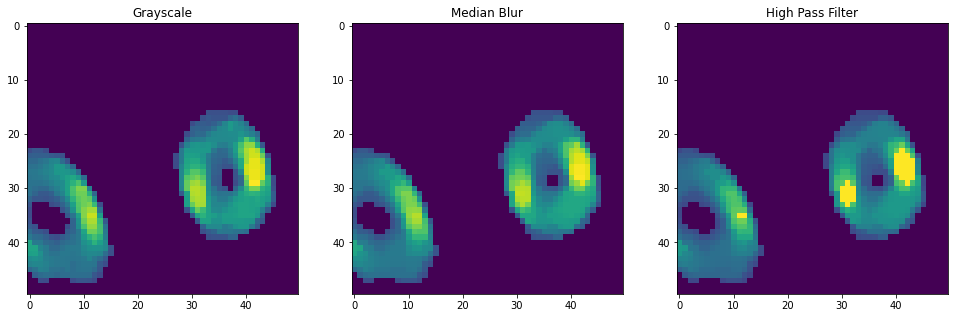

In [ ]:
# visualise preprocessing

import cv2
import matplotlib.pyplot as plt
job_name = '3cut_preprocessing_cmapgray'
radius = 750
threshold = 55
image_path = '/content/gdrive/MyDrive/CY2003_MnT/training_data/3_50x50/3cut0_500.png'
img = cv2.imread(image_path, 0) #greyscale
_height, _width = img.shape
	
img_c = img[_height//2-radius:_height//2+radius, _width//2 - radius: _width//2 + radius]

img_c = cv2.medianBlur(img_c, 3)

img_i = ~img_c # invert 

img_i[img_i < 55] = 0 # removes all the bright stuff in the original image

inv = ~img_i # invert high pass filtered

f, axarr = plt.subplots(nrows=1,ncols=3)
plt.sca(axarr[0]); 
plt.imshow(img); plt.title('Grayscale')
plt.sca(axarr[1]); 
plt.imshow(img_c); plt.title('Median Blur')
plt.sca(axarr[2]); 
plt.imshow(inv); plt.title('High Pass Filter')
plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/preprocessing/{}.png'.format(job_name),bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(16.5, 8.5)
fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/preprocessing/{}_big.png'.format(job_name), dpi= 100,bbox_inches = 'tight')
plt.show()

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

data_dir = '/content/gdrive/MyDrive/CY2003_MnT/training_data/12jun_cut/'
cell_images = [f for f in os.listdir(data_dir + 'heic_to_png/') if f.endswith('.png')]

for image in cell_images:
  # preprocessing
  image_cut = preprocess(data_dir+ 'heic_to_png/' + image)

  plt.imshow(image_cut, cmap='gray')

  cv2.imwrite(data_dir + "processed/" + image , image_cut)

  imago = cv2.imread(data_dir + "processed/" + image)
  count = image.replace(".png", "")
  for r in range(0,imago.shape[0],50):
    for c in range(0,imago.shape[1],50):
        plt.imshow(imago[r:r+50, c:c+50,:], cmap='gray')
        cv2.imwrite(data_dir + "processed_cut/" + count + "cut" + f"{r}_{c}.png",imago[r:r+50, c:c+50,:])
print('Done!')
  

Done!


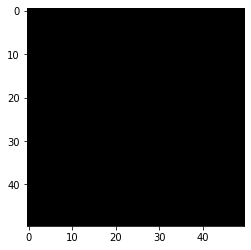

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

data_dir = '/content/gdrive/MyDrive/CY2003_MnT/training_data/'
dest = '/content/gdrive/MyDrive/CY2003_MnT/training_data/4_50x50/'
cell_images = [f for f in os.listdir(data_dir + 'processed/') if f.endswith('4.png')]
for image in cell_images:
 imago = cv2.imread(data_dir + 'processed/' + image)
 for r in range(0,imago.shape[0],50):
    for c in range(0,imago.shape[1],50):
        plt.imshow(imago[r:r+50, c:c+50,:], cmap='gray')
        cv2.imwrite(dest + '4' + "cut" + f"{r}_{c}.png",imago[r:r+50, c:c+50,:])
print('Done!')
  

In [ ]:
import pandas as pd
import os

# create a CSV for all 50 x 50 images for each image with empty column n_cells
data_dir = '/content/gdrive/MyDrive/CY2003_MnT/training_data/'
cell_images = [f for f in os.listdir(data_dir + '3_50x50/') if f.startswith('3cut') and f.endswith('.png')]
cell_image = [f for f in os.listdir(data_dir + '4_50x50/') if f.startswith('4cut') and f.endswith('.png')]
cellImage = cell_images + cell_image
d = {'filename': cellImage}
df = pd.DataFrame(data=d)
# set default cell count to 0 to save keystrokes
df["n_cells"] = "0"
print(df)
df.to_csv(data_dir+ '3n4_50x50.csv',index=False)

               filename n_cells
0           3cut0_0.png       0
1          3cut0_50.png       0
2         3cut0_100.png       0
3         3cut0_150.png       0
4         3cut0_200.png       0
...                 ...     ...
1795  4cut1450_1250.png       0
1796  4cut1450_1300.png       0
1797  4cut1450_1350.png       0
1798  4cut1450_1400.png       0
1799  4cut1450_1450.png       0

[1800 rows x 2 columns]


In [ ]:
# move images in bulk 
import os, shutil

data_dir = '/content/gdrive/MyDrive/cy2003_cellcounting/training_data_13jun/processed_cut50x50/'
dest = '/content/gdrive/MyDrive/CY2003_MnT/training_data/4_50x50/'
temp = '/content/gdrive/MyDrive/CY2003_MnT/training_data/3_50x50/'
cell_images = [f for f in os.listdir(temp) if f.startswith('4cut') and f.endswith('.png')]
print(len(cell_images))
for image in cell_images:
  shutil.move(dest + image, temp)

print('Done!')

1800
Done!


/content/gdrive/MyDrive/CY2003_MnT/training_data/12jun_cut30x30/1cut990_0.png
/content/gdrive/MyDrive/CY2003_MnT/training_data/13jun50x50/1cut990_0.png
Done!


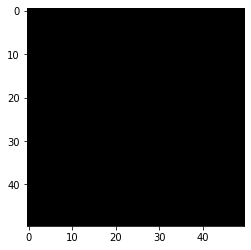

In [ ]:
# resize 30 x 30 to 50 x 50
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

data_dir = '/content/gdrive/MyDrive/CY2003_MnT/training_data/'
cell_images = [f for f in os.listdir(data_dir + '12jun_cut30x30/') if f.startswith('1cut') and f.endswith('.png')]
for image in cell_images:
    img = cv2.imread(data_dir + '12jun_cut30x30/' + image)
    res = cv2.resize(img, dsize=(50, 50), interpolation=cv2.INTER_CUBIC)
    plt.imshow(res)
    cv2.imwrite(data_dir + "13jun_cut50x50/" + image,res)

print('Done!')

In [ ]:
# concatenate multiple csvs tgt
import pandas as pd
df1 = pd.read_csv('/content/gdrive/MyDrive/CY2003_MnT/training_data/1_50x50.csv')
df2 = pd.read_csv('/content/gdrive/MyDrive/CY2003_MnT/training_data/2_50x50.csv')

finaldf = pd.concat([df1, df2], axis =0)
print(finaldf)
finaldf.to_csv('/content/gdrive/MyDrive/CY2003_MnT/training_data/1n2.csv', index = False)

              filename  n_cells
0       1cut900_90.png        0
1      1cut900_120.png        1
2      1cut900_210.png        0
3      1cut900_780.png        0
4        1cut990_0.png        0
..                 ...      ...
895  2cut1450_1250.png        0
896  2cut1450_1300.png        0
897  2cut1450_1350.png        0
898  2cut1450_1400.png        0
899  2cut1450_1450.png        0

[1805 rows x 2 columns]


## Machine Learning CNN Pipeline

In [ ]:
# imports and file locations

import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path

In [ ]:
# heavier imports

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
import tensorflow as tf
from tensorflow.keras import layers
import tensorflow.keras as keras

### Load training data and make class labels (Old Version)

* We have retired this code and use HDF5s instead. See next cell for HDF5 loading and splitting into training, validation and testing datasets.

In [ ]:
label_file_path =  '/content/gdrive/MyDrive/CY2003_MnT/training_data/3n4_50x50.csv'
training_data_folder = '/content/gdrive/MyDrive/CY2003_MnT/training_data/3_50x50/'

label_df = pd.read_csv(label_file_path)

X = [] # im directly loading into memory because it's not that much data.... maybe 10MB with 10k images... 
y = label_df.n_cells.to_numpy()

y = label_binarize(y, classes=[0,1, 2, 3, 4, 5])

#print(y)

for index, row in label_df.iterrows(): # might be inefficient idk this is what i know


  label_df.at[index, 'file_root'] = row.filename.split("/")[-1]

  

  #_img = cv2.imread()
  
  _img_path = os.path.join(training_data_folder, label_df.at[index, 'file_root'])

  print(_img_path)

  _img = cv2.imread(_img_path, 0) # model is greyscale 

  _img = cv2.resize(_img, dsize=(40, 40), interpolation=cv2.INTER_CUBIC)
  _img = cv2.normalize(_img, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

  _img = _img.reshape(_img.shape + (1,))

  # do rescaling and normalisation as a batch using keras 

  X.append(_img)

X = np.array(X)
X = X.astype('float64')



### HDF5 Loading (Testing if it works)

In [ ]:
# hdf5 loading

import h5py

hdf5_path = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/21jun_300x0n1n2n3n4cells.hdf5'
label_file_path =  '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/20jun_300x0n1n2n3n4cells.csv'

label_df = pd.read_csv(label_file_path)

# kill me

# convert csv file to labels

labels = {}

#print(label_df.set_index('filename').T.to_dict('list'))

for index, row in label_df.iterrows():
  labels[row.filename] = row.n_cells

print(labels) # key:Value for no. of cells

training, test = train_test_split(all_labels, test_size = 0.2, random_state = 42)
training, validation = train_test_split(training, test_size = 0.2, random_state = 42)



# partiion the IDs into training, validation, and test
partition = {"training": training, "test": test, "validation": validation}

print(len(partition['training']))
print(len(partition['test']))
print(len(partition['validation']))


#print(*partition['training'],sep='\n')



In [ ]:
f = h5py.File(hdf5_path)

_ID = "20jun_generated_50x50_300x4cell_1_6_4.png"
print(labels[_ID])
_x = np.array(f.get(_ID))
print(np.max(_x))

4
0.0039215684


### Defining Data Generator

In [ ]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, file_name, list_IDs, labels, batch_size=32, n_channels=1,
                 n_classes=5, shuffle=True, augmentation = False, dim = (40, 40, 1)):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()
        self.augmentation = augmentation
        self.file_name = file_name

    def __len__(self):
        'Denotes the number of batches per epoch'

        if self.augmentation:
          return 2 * int(np.floor(len(self.list_IDs) / self.batch_size))
        else:
          return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch

        if self.augmentation:
          #indexes = self.indexes[index*self.batch_size//2:(index+1)*self.batch_size//2]
          indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        else:
          indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __augment(self, data):

      # randomly rotate

      #data = np.rot90(data, np.random.randint(1, 4))     

      # randomly skew

      #data = cv2.warpAffine(img, )
      # https://stackabuse.com/affine-image-transformations-in-python-with-numpy-pillow-and-opencv
      
      # randomly add noise

      #print(data.shape)

      #data += np.random.rand(*data.shape) * 0.2

      # flip
      # if np.random.randint(2):
      #   data = np.fliplr(data)
      # if np.random.randint(2):
      #   data = np.flipud(data)


      #data = np.absolute(data) # just in case the gaussian noise makes it negative

      assert not np.isnan(data).any()

      return data

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim))
        y = np.empty((self.batch_size), dtype=int)

        f = h5py.File(self.file_name)

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            #X[i,] = np.load('' + ID + '.npy')
            data = np.array(f.get(str(ID)))

            #print(ID, np.max(data))
            # do augmentation stuff here

            data *= 255.0


            if self.augmentation:
              if i <= self.batch_size // 2:
                pass
                # do nothing
              else:
                data = self.__augment(data)

            else:
              # do nothing
              pass

            X[i,] = data
            #assert not np.isnan(data)

            # Store class
            y[i] = self.labels[ID]

            assert not np.isnan(data).any()

        #print(np.max(X))
        
        assert not np.isnan(X).any()
        assert not np.isnan(y).any()
        #assert np.max(X) <= 1
        assert np.max(y) < 6
        #print(y[i])
        #print(label_binarize(y, classes=list(range(0, self.n_classes))))
        #return X, label_binarize(y, classes=list(range(0, self.n_classes)))
        #rint(X[0], y[0])
        return X, y

In [ ]:
params = {
    'dim' : (40, 40, 1),
    'batch_size': 32,
    'n_classes': 5,
    'n_channels':1,
    'shuffle': True,
    'augmentation' : True,
}

training_generator = DataGenerator(hdf5_path, partition['training'], labels, **params)
validation_generator = DataGenerator(hdf5_path, partition['validation'], labels, **params)


### Define Model

In [ ]:
# define and compile model

from tensorflow.keras import regularizers


model = tf.keras.Sequential([   
  layers.Conv2D(16, 11, input_shape = (40,40,1), kernel_regularizer=regularizers.l2(1e-4),), #do i need so many filters? who knows?
  layers.BatchNormalization(),
  layers.Activation("tanh"),
  layers.MaxPooling2D(pool_size = (2,2)),
  layers.Dropout(0.5),
  layers.Conv2D(32, 7, kernel_regularizer=regularizers.l2(1e-4)), #do i need so many filters? who knows?
  layers.BatchNormalization(),
  layers.Activation("tanh"),
  layers.MaxPooling2D(pool_size = (2,2)),
  layers.Dropout(0.5),
  layers.Flatten(),
  layers.Dense(5, activation = "softmax", )
])


model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.001, name = 'help'),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


### Custom Categorical CrossEntropy

* We defined our own function to debug NaN losses. Print statements are used for logging and tracing source of errors.


In [ ]:

 
def custom_categorical_crossentropy(output, target, from_logits = False): # copied from keras source code and modified
    """Categorical crossentropy between an output tensor and a target tensor.
    # Arguments
        output: A tensor resulting from a softmax
            (unless `from_logits` is True, in which
            case `output` is expected to be the logits).
        target: A tensor of the same shape as `output`.
        from_logits: Boolean, whether `output` is the
            result of a softmax, or is a tensor of logits.
    # Returns
        Output tensor.
    """
    
    output = tf.cast(output, 'float32') # resolve type error 
    #tf.print(output, "Before loss function")
    #tf.print("#############################")
    # Note: tf.nn.softmax_cross_entropy_with_logits
    # expects logits, Keras expects probabilities.
    if not from_logits:
        # scale preds so that the class probas of each sample sum to 1
        output /= (tf.reduce_sum(output,
                               axis=len(output.get_shape()) - 1,
                                keepdims=True) + 1e-6)
        # traced NAN to here 
        #tf.print(output, "After scaling")
        #tf.print("#############################")
        # manual computation of crossentropy
        epsilon =  tf.convert_to_tensor(tf.keras.backend.epsilon())
        if tf.keras.backend.epsilon() != output.dtype.base_dtype:
          epsilon = tf.cast(epsilon, output.dtype.base_dtype)
        #tf.print("#############################")
        #tf.print(output, "Before clipping")
        output = tf.clip_by_value(output, epsilon, 1. - epsilon)
        #tf.print(output, [output], "Inside loss function")
        #tf.print("#############################")
        #tf.print(output, "Inside loss function")
        #tf.print("#############################")
        #tf.print(- tf.reduce_sum(target * tf.math.log(output),
        #                            axis=len(output.get_shape()) - 1), "Returned value" )

        final = - tf.reduce_sum(target * tf.math.log(output),
                               axis=len(output.get_shape()) - 1) 
        # convert NANs to 0 
        output_no_nan = tf.dtypes.cast(tf.math.logical_not(tf.math.is_nan(final)), dtype = tf.float32)
        final = tf.math.multiply_no_nan(final, output_no_nan)

        """return - tf.reduce_sum(target * tf.math.log(output),
                               axis=len(output.get_shape()) - 1) """
        return final
    else:
        return tf.nn.softmax_cross_entropy_with_logits(labels=target,
                                                       logits=output) 

### Fit model

In [ ]:
def scheduler(epoch, lr):
  if epoch < 20:
    return lr
  else:
    return lr * 0.9

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)

In [ ]:
# load model from old one
#model = tf.keras.models.load_model('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/models/1n2_40x40normalisedmodel.h5')

# Show the model architecture
model.summary()

#rmb not to compile model after loading it otherwise weights will be reset

Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_70 (Conv2D)           (None, 30, 30, 16)        1952      
_________________________________________________________________
batch_normalization_67 (Batc (None, 30, 30, 16)        64        
_________________________________________________________________
activation_80 (Activation)   (None, 30, 30, 16)        0         
_________________________________________________________________
max_pooling2d_70 (MaxPooling (None, 15, 15, 16)        0         
_________________________________________________________________
dropout_67 (Dropout)         (None, 15, 15, 16)        0         
_________________________________________________________________
conv2d_71 (Conv2D)           (None, 9, 9, 32)          25120     
_________________________________________________________________
batch_normalization_68 (Batc (None, 9, 9, 32)        

In [ ]:
checkpoint_filepath = '/content/gdrive/MyDrive/CY2003_MnT/mlstuff/models/21jun_synthetic_zy_aug'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_filepath, save_weights_only=False, monitor = 'val_accuracy', mode = 'max', save_best_only=True)

In [ ]:
# #r = model.fit(dataGen.flow(X_train, y_train, batch_size = 32, subset = 'training'), 
#               epochs=50,
#               validation_data = dataGen.flow(X_train, y_train, batch_size = 8, subset = 'validation')
#               ) # with data generator
# r = model.fit(X_train, y_train, epochs=50, batch_size = 4)

r = model.fit_generator(generator = training_generator,
                        validation_data = validation_generator, epochs = 50, callbacks = [callback,model_checkpoint_callback])
#callbacks = [model_checkpoint_callback])

Epoch 1/50
 1/60 [..............................] - ETA: 5s - loss: 0.5458 - accuracy: 0.9062

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


60/60 [==============================] - 5s 86ms/step - loss: 1.0478 - accuracy: 0.5750 - val_loss: 3.9302 - val_accuracy: 0.1562
Epoch 2/50
60/60 [==============================] - 5s 84ms/step - loss: 0.9765 - accuracy: 0.6036 - val_loss: 4.3732 - val_accuracy: 0.1473
Epoch 3/50
60/60 [==============================] - 5s 85ms/step - loss: 1.0773 - accuracy: 0.5557 - val_loss: 3.6918 - val_accuracy: 0.1183
Epoch 4/50
60/60 [==============================] - 5s 84ms/step - loss: 1.0803 - accuracy: 0.5516 - val_loss: 4.5903 - val_accuracy: 0.1585
Epoch 5/50
60/60 [==============================] - 5s 84ms/step - loss: 0.9934 - accuracy: 0.5948 - val_loss: 3.7668 - val_accuracy: 0.1518
Epoch 6/50
60/60 [==============================] - 5s 85ms/step - loss: 0.9524 - accuracy: 0.6313 - val_loss: 4.3490 - val_accuracy: 0.1473
Epoch 7/50
60/60 [==============================] - 5s 85ms/step - loss: 1.0141 - accuracy: 0.5776 - val_loss: 3.3201 - val_accuracy: 0.1339
Epoch 8/50
60/60 [======

### Test, Save model, plot Loss and Accuracy

In [ ]:
test_loss, test_acc = model.evaluate(X_test,  y_test, verbose=2)

print('\nTest accuracy:', test_acc)

[nan, nan]
[nan, nan]


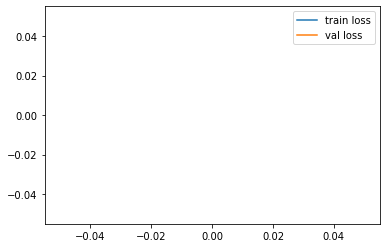

[0.34427082538604736, 0.3427083194255829]
[0.3683035671710968, 0.375]


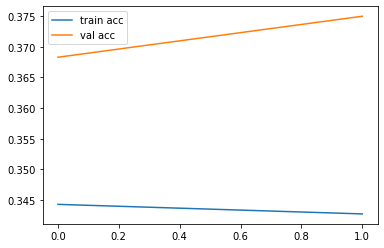

In [ ]:
job_name = "21jun_synthetic_dataset"
print(r.history['loss'])
print(r.history['val_loss'])
plt.plot(r.history['loss'], label='train loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.legend()
plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/plots/{}_loss.png'.format(job_name))
plt.show()
plt.clf()

print(r.history['accuracy'])
print(r.history['val_accuracy'])

# plot the accuracy
plt.plot(r.history['accuracy'], label='train acc')
plt.plot(r.history['val_accuracy'], label='val acc')
plt.legend()
plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/plots/{}_accuracy.png'.format(job_name))
plt.show()

model.save('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/models/{}.h5'.format(job_name))

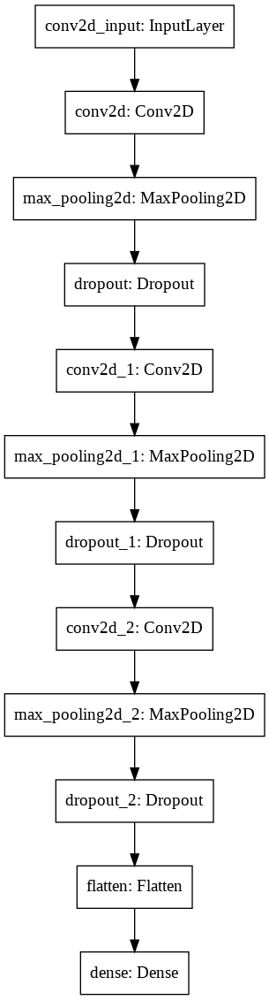

In [ ]:
# plot model architecture as image
job_name = "testestGeneratormodel"
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='/content/gdrive/MyDrive/CY2003_MnT/mlstuff/models/{}_modelarchitecture.png'.format(job_name))

### Load and do prediction

[2, 2, 2, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 2, 1, 1, 0, 2, 0]
[4 4 4 1 0 4 4 4 1 1 2 0 1 3 4 4 4 4 4 0]


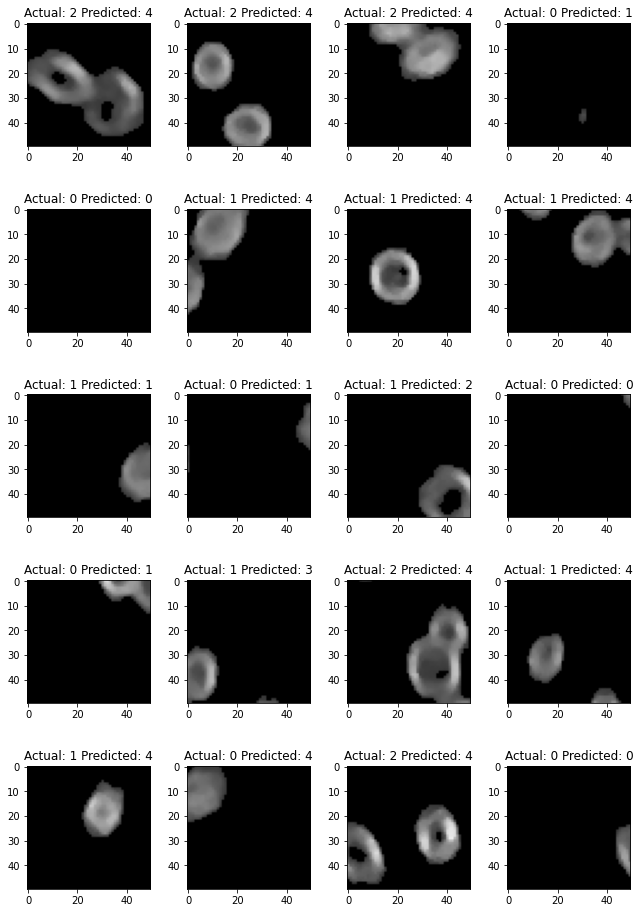

In [ ]:
model = tf.keras.models.load_model('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/models/21jun_synthetic_zy')

# numpy array as input

# first load prediction set


prediction_path = '/content/gdrive/MyDrive/CY2003_MnT/training_data/predictionset/'
answers = []

a_df = pd.read_csv('/content/gdrive/MyDrive/CY2003_MnT/training_data/3n4_50x50_removedlabels.csv')
prediction_set = []

for f in os.listdir(prediction_path):
  _img = cv2.imread(os.path.join(prediction_path, f), 0)
  _img = cv2.resize(_img, dsize=(40, 40), interpolation=cv2.INTER_CUBIC)
  _img = _img.astype("float32") / np.max(img)
  _img = _img.reshape(_img.shape + (1,))
 
  answers.append(a_df.loc[a_df['filename'] == f, 'n_cells'].iloc[0])

  prediction_set.append(_img)

#print(prediction_set)
print(answers)

prediction_set = np.array(prediction_set)
results = model.predict(prediction_set)


"""results = np.array(
[[9.9977690e-01, 7.3913638e-05, 1.4922438e-04],
		 [9.9986076e-01,5.3622240e-05,8.5603235e-05],
		 [9.9988675e-01,4.0935480e-05,7.2340044e-05],
		 [9.9986017e-01, 6.3063875e-05, 7.6794742e-05],
		 [9.9989760e-01, 4.1826079e-05, 6.0540406e-05],
		 [9.9982458e-01, 9.3654875e-05, 8.1731494e-05],
		 [9.9991107e-01, 2.8039038e-05, 6.0864368e-05],
		 [9.9994731e-01, 3.2425753e-05, 2.0308071e-05],
		 [9.9987710e-01, 4.4904958e-05, 7.7946803e-05],
		 [9.9991512e-01, 3.6834386e-05, 4.8030513e-05],
		 [9.9988556e-01, 3.2432225e-05, 8.2009683e-05],
		 [9.9987710e-01, 4.4932331e-05, 7.7973942e-05],
		 [9.9991751e-01, 3.0010884e-05, 5.2489122e-05],
		 [9.9988067e-01, 4.8643273e-05, 7.0664937e-05],
		 [9.9984336e-01, 5.9031219e-05, 9.7662232e-05],
		 [9.9985743e-01, 5.2818479e-05, 8.9799025e-05],
		 [9.9991488e-01, 3.8596427e-05, 4.6459532e-05],
		 [9.9987304e-01, 4.6381221e-05, 8.0589067e-05],
		 [9.9988735e-01, 4.2267329e-05, 7.0334085e-05],
		 [9.9955577e-01, 2.1459538e-04, 2.2955591e-04]])"""

# then load answers
prediction_filenames = [f for f in os.listdir(prediction_path)]
df = a_df[a_df['filename'].isin(prediction_filenames)]
#actual_count = df['n_cells'].sum() #summed up
# make prediction
prediction = np.argmax(results, axis =1)

print(prediction)
#prediction = np.array([1,0,0,2,1,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0])
#prediction_count = np.sum(prediction) #summed up

# plot picture with actual answer and prediction
w = 10
h = 10
fig = plt.figure(figsize=(9, 13))
columns = 4
rows = 5

ax = []
count = 0
for i in range(columns*rows):
    img = plt.imread(prediction_path + prediction_filenames[count])
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    ax[-1].set_title("Actual: " + str(df.loc[df['filename'] == prediction_filenames[count], 'n_cells'].iloc[0]) + " Predicted: " + prediction[count].astype('str'))  # set title
    count += 1
    #ax[-1].set_axis_off() # remove axis
    plt.imshow(img)

plt.tight_layout(pad=0.75)
plt.show()  # finally, render the plot

# V3 Blob Detection

The prototyping log and thought process behind this can be found [here](https://blogs.ntu.edu.sg/ps9888-2021-g18/2021/07/23/blob-detection/).

## V3.1: SimpleBlobDetector

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import os
from pylab import rcParams

1


Text(0.5, 1.0, 'Circles Detected')

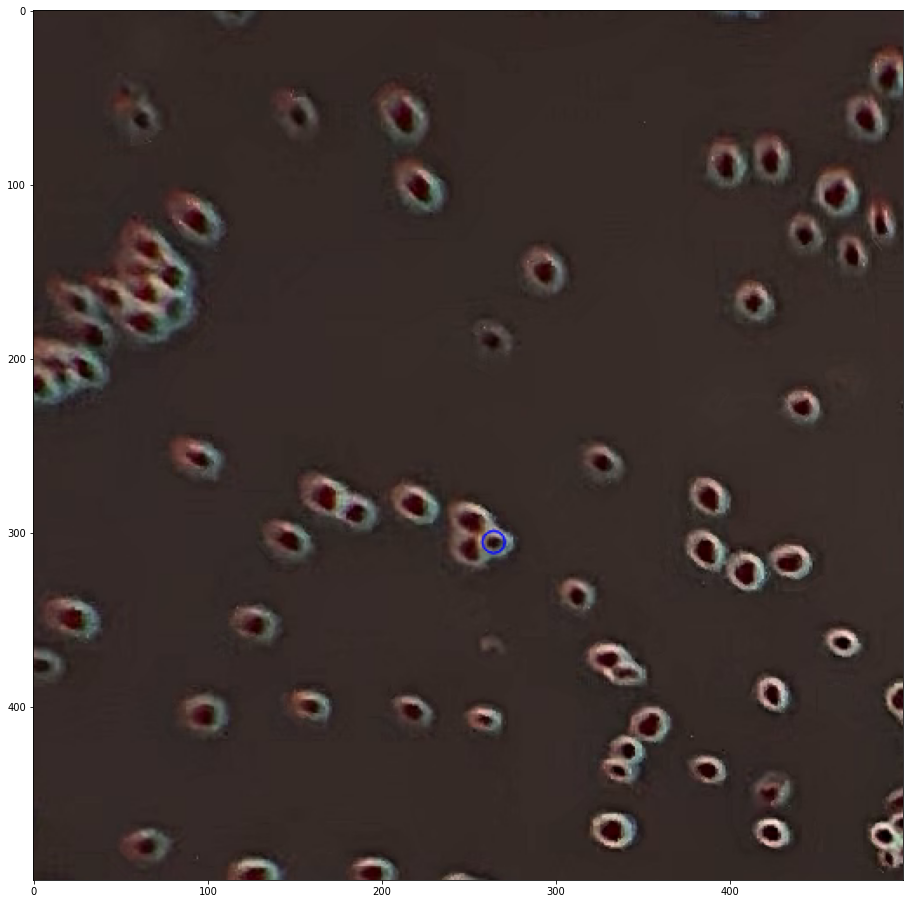

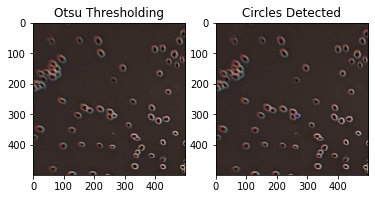

In [ ]:
img = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1contrast.png')

# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

# Change thresholds
params.minThreshold = 0
params.maxThreshold = 256

# Filter by Area.
params.filterByArea = True
params.minArea = 30
params.maxArea = 10000

# Filter by Color (black=0)
params.filterByColor = True
params.blobColor = 0

# Filter by Circularity
params.filterByCircularity = False
#params.minCircularity = 0.5
#params.maxCircularity = 1

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.5
params.maxConvexity = 1

# Filter by InertiaRatio
params.filterByInertia = True
params.minInertiaRatio = 0
params.maxInertiaRatio = 1

# Distance Between Blobs
params.minDistBetweenBlobs = 0

# Do detecting
detector = cv2.SimpleBlobDetector_create(params)

# find key points for blob detection
keypoints = detector.detect(erosion)

# create black screen on which shapes are drawn
blank = np.zeros((1,1))

blobs = cv2.drawKeypoints(img, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(blobs)
figure = plt.gcf() # get current figure
figure.set_size_inches(24, 16)
#figure.savefig('/content/gdrive/MyDrive/cy2003_cellcounting/simpleblobdetectorpreprocessed.png', dpi = 100)
# number of cells detected
n_cells = len(keypoints)
print(n_cells)
f, axarr = plt.subplots(nrows=1,ncols=2)
plt.sca(axarr[0]); 
plt.imshow(img); plt.title('Otsu Thresholding')
plt.sca(axarr[1]); 
plt.imshow(blobs); plt.title('Circles Detected')

# doesn't work for more ellipsoidal cells
# need to improve identification

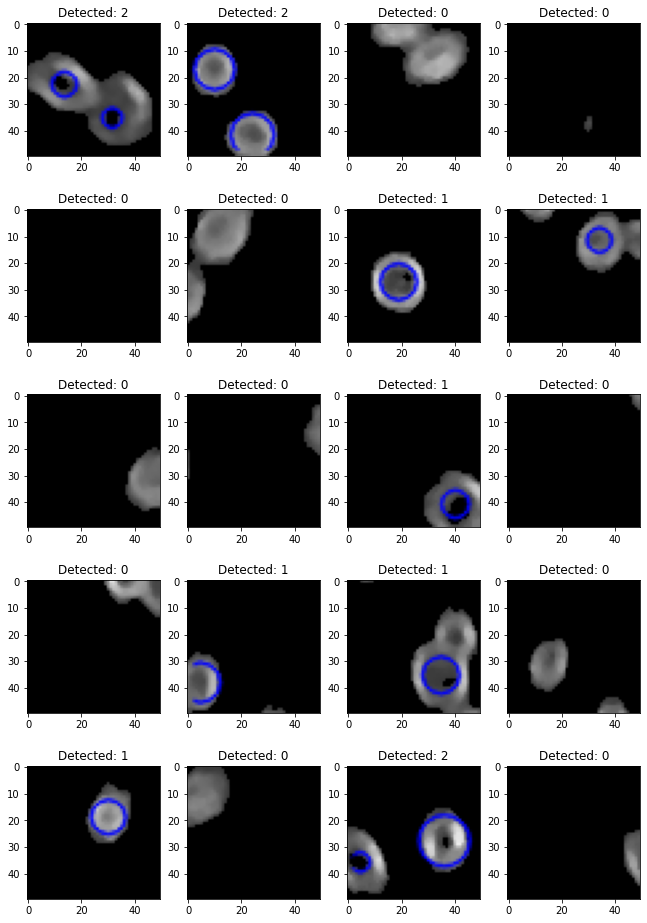

In [ ]:
prediction_path = '/content/gdrive/MyDrive/CY2003_MnT/training_data/predictionset/'
w = 10
h = 10
fig = plt.figure(figsize=(9, 13))
columns = 4
rows = 5

ax = []
count = 0
prediction_filenames = [f for f in os.listdir(prediction_path)]
for i in range(columns*rows):
    img =  cv2.imread(prediction_path + prediction_filenames[count])
    keypoints = detector.detect(img)
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    blank = np.zeros((1,1))
    blobs = cv2.drawKeypoints(img, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    ax[-1].set_title("Detected: " + str(len(keypoints)))  # set title
    count += 1
    #ax[-1].set_axis_off() # remove axis
    plt.imshow(blobs)

plt.tight_layout(pad=0.75)
plt.show()  # finally, render the plot

## V3.2 Otsu's Thresholding and Connected Components Detection

*   Preprocessing (cropping to 1500 x 1500, inverting, erosion)
*   Otsu's Thresholding
*   Further preprocesing via erosion
*   Make it such that cell nuclei are the most identifiable/ brightest dots in  pic
*   Find contours in image of brightest dots (good for clustered cells and cells with non uniform shapes)

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow

550


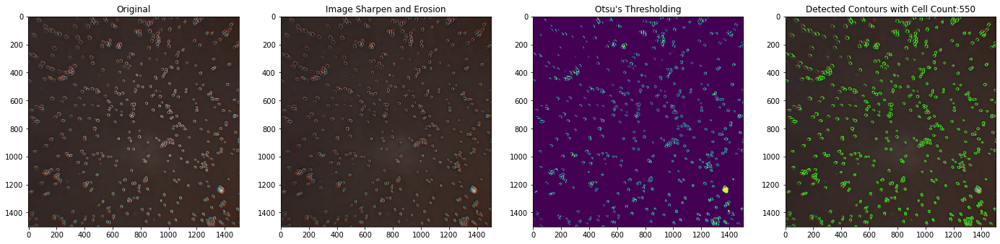

In [ ]:
"""Best performance out of all"""
image = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/heic_to_png/1.png')
#image = cv2.bitwise_not(image) # obtained by inverting image using bitwise_not and saving 
height, width, channels = image.shape

"""y=400
x=200
h=600
w=600"""
radius = 750
image = image[height//2-radius:height//2+radius, width//2 - radius: width//2 + radius]
image = cv2.bitwise_not(image)
# use numpy slicing to execute the crop
#image = image[y:y+h, x:x+w]
#image = cv2.bitwise_not(image)
original = image.copy()

sharpen_filter = np.array([[-1, 0, -1],
	[0, 9, 0],
	[-1, 0, -1]]) 
# helpful to understand what kernels are: https://setosa.io/ev/image-kernels/ (more for me lol)
# can upload image and experiment with kernel values to know what works best
#sharped_img = cv2.filter2D(image, -1, sharpen_filter) # try to sharpen image so cell wall v cell nuclei is distinct
#image = cv2.bitwise_not(sharped_img) # invert image for stronger contrast
kernel = np.ones((2,2),np.uint8)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter
#cv2_imshow(sure_bg)
gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
ret, thresh = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU) # apply otsu threshold
kernel2 = np.ones((1,1),np.uint8)
thresh = cv2.erode(thresh,kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth
#cv2_imshow(thresh)
#fig = plt.gcf()
#fig.set_size_inches(24,16)
#plt.show()

cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

min_area = 0 #set minimum area to 0 as dots are vv small and preprocessing makes sure cell nuclei is brightest
white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs
# can invert to do blob detection but dots becomes smaller + need to set params for blob detection
for c in cnts:
    area = cv2.contourArea(c)
    if area > min_area:
        cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
        white_dots.append(c)

#cv2_imshow(image)
print(len(white_dots))
#imago = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1.png')
#cv2_imshow(imago)

f, axarr = plt.subplots(nrows=1,ncols=4)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')
plt.sca(axarr[2]); 
plt.imshow(thresh); plt.title('Otsu\'s Thresholding')
plt.sca(axarr[3]); 
plt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_without_sharpening.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(24, 16)
fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_big_without_sharpening.png', dpi= 100,bbox_inches = 'tight')
plt.show()

81


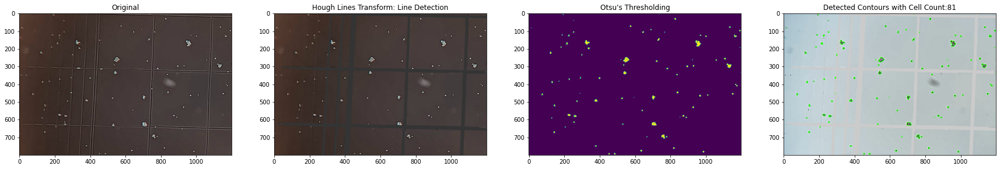

'\nthresh = cv2.adaptiveThreshold(blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,11,3)\ncv2_imshow(thresh)\nkernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))\nerode = cv2.erode(thresh, kernel, iterations=1)\ndilate = cv2.dilate(erode, kernel, iterations=3)\n\ncnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)\ncnts = cnts[0] if len(cnts) == 2 else cnts[1]\n\nmask = np.zeros(image.shape, dtype=np.uint8)\nfor c in cnts:\n    area = cv2.contourArea(c)\n    if area > 850:\n        cv2.drawContours(mask, [c], -1, (255,255,255), -1)\n\nmask = cv2.dilate(mask, kernel, iterations=1)\nimage = 255 - image\nresult = 255 - cv2.bitwise_and(mask, image)\n\ncv2_imshow(erode)\ncv2_imshow(result)'

In [ ]:
# remove grid lines 
# TODO: play around with settings to find out which brings out grid lines the best
# make a mask of grid lines
# remove grid lines by smushing the pic and mask tgt / make modifications to mask so cells on right and bottom grid line not counted 

import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/cell_photos_in_hemocytometer/IMG_3644.png')
image = image[1700:2500, 500:1700]
image = cv2.bitwise_not(image)
original = image.copy()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

"""# Create mask to isolate hemocytometer grid lines by hsv values
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
low_range = np.array([18, 94, 140])
up_range = np.array([48, 255, 255])
mask = cv2.inRange(hsv, low_range, up_range)"""

"""gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
result = cv2.bitwise_and(image,image,mask=thresh)
result[thresh==0] = (255,255,255)"""

#gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#ret,thresh = cv2.threshold(gray,180,255,cv2.THRESH_BINARY)

# Edge detection
edges = cv2.Canny(gray,50,150,apertureSize = 3)
# Line detection
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 100, minLineLength = 100,maxLineGap=80)
#cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/cell_photos_in_hemocytometer/before_lines.png', gray)
if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(image, (x1, y1), (x2, y2), (52, 52, 52), 5)

hough_lines = image.copy()
# Detect 4 x 4 Grid
# Create mask to block everything outside of 4 x 4
# Create second mask to remove 4 x 4 grid lines without erasing cells + ignore cells on right and bottom line
image = cv2.bitwise_not(image)
kernel = np.ones((2,2),np.uint8)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter
#cv2_imshow(sure_bg)
gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
ret, thresh = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU) # apply otsu threshold
kernel2 = np.ones((1,1),np.uint8)
thresh = cv2.erode(thresh,kernel,iterations = 1)

cnts = cv2.findContours(255-thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

min_area = 0 #set minimum area to 0 as dots are vv small and preprocessing makes sure cell nuclei is brightest
max_area = 500 # set maximum area
white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs
# can invert to do blob detection but dots becomes smaller + need to set params for blob detection
for c in cnts:
    area = cv2.contourArea(c)
    if area > min_area:
        cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
        white_dots.append(c)

#cv2_imshow(image)
print(len(white_dots))


f, axarr = plt.subplots(nrows=1,ncols=4)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(hough_lines); plt.title('Hough Lines Transform: Line Detection')
plt.sca(axarr[2]); 
plt.imshow(255-thresh); plt.title('Otsu\'s Thresholding')
plt.sca(axarr[3]); 
plt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_hough_lines_removed.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(30, 20)
fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_big_hough_lines_removed.png', dpi= 100,bbox_inches = 'tight')
plt.show()

"""
thresh = cv2.adaptiveThreshold(blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,11,3)
cv2_imshow(thresh)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
erode = cv2.erode(thresh, kernel, iterations=1)
dilate = cv2.dilate(erode, kernel, iterations=3)

cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

mask = np.zeros(image.shape, dtype=np.uint8)
for c in cnts:
    area = cv2.contourArea(c)
    if area > 850:
        cv2.drawContours(mask, [c], -1, (255,255,255), -1)

mask = cv2.dilate(mask, kernel, iterations=1)
image = 255 - image
result = 255 - cv2.bitwise_and(mask, image)

cv2_imshow(erode)
cv2_imshow(result)"""

684


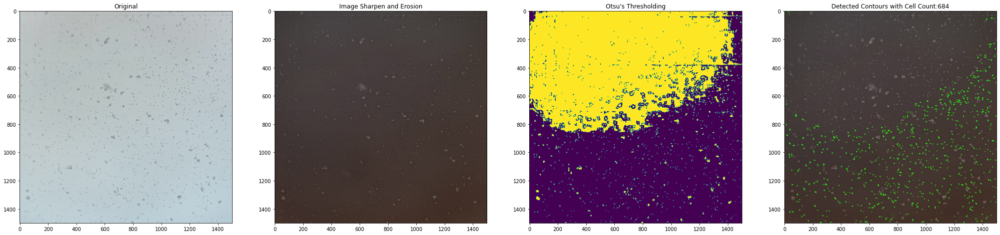

In [ ]:
"""For hemocytometer images (edited)"""

#image = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/heic_to_png/1.png')
image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/cell_photos_in_hemocytometer/IMG_3633.png')
#original = image.copy()
#image = cv2.bitwise_not(image) # obtained by inverting image using bitwise_not and saving 
original = image.copy()
height, width, channels = image.shape

y=1000
x=1000
h=1500
w=1500
#radius = 750
#image = image[height//2-radius:height//2+radius, width//2 - radius: width//2 + radius]
#original = original[height//2-radius:height//2+radius, width//2 - radius: width//2 + radius]
#image = cv2.bitwise_not(image)
# use numpy slicing to execute the crop
image = image[y:y+h, x:x+w]
original = original[y:y+h, x:x+w]
#image = cv2.bitwise_not(image)
#original = image.copy()
image = cv2.bitwise_not(image)

sharpen_filter = np.array([[-1, 0, -1],
	[0, 9, 0],
	[-1, 0, -1]]) 
# helpful to understand what kernels are: https://setosa.io/ev/image-kernels/ (more for me lol)
# can upload image and experiment with kernel values to know what works best
#sharped_img = cv2.filter2D(image, -1, sharpen_filter) # try to sharpen image so cell wall v cell nuclei is distinct
#image = cv2.bitwise_not(sharped_img) # invert image for stronger contrast

kernel = np.ones((2,2),np.uint8)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter
#cv2_imshow(sure_bg)
gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
ret, thresh = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU) # apply otsu threshold
kernel2 = np.ones((1,1),np.uint8)
thresh = cv2.erode(thresh,kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth
#cv2_imshow(thresh)
#fig = plt.gcf()
#fig.set_size_inches(24,16)
#plt.show()
#thresh = 255 - thresh
cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

min_area = 0 #set minimum area to 0 as dots are vv small and preprocessing makes sure cell nuclei is brightest
max_area = 50 # set maximum area
white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs
# can invert to do blob detection but dots becomes smaller + need to set params for blob detection
for c in cnts:
    area = cv2.contourArea(c)
    if max_area > area > min_area:
        cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
        white_dots.append(c)

#cv2_imshow(image)
print(len(white_dots))
#imago = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1.png')
#cv2_imshow(imago)

f, axarr = plt.subplots(nrows=1,ncols=4)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')
plt.sca(axarr[2]); 
plt.imshow(thresh); plt.title('Otsu\'s Thresholding')
plt.sca(axarr[3]); 
plt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
#plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_without_sharpening.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(35, 25)
#fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_big_without_sharpening.png', dpi= 100,bbox_inches = 'tight')
plt.show()

3


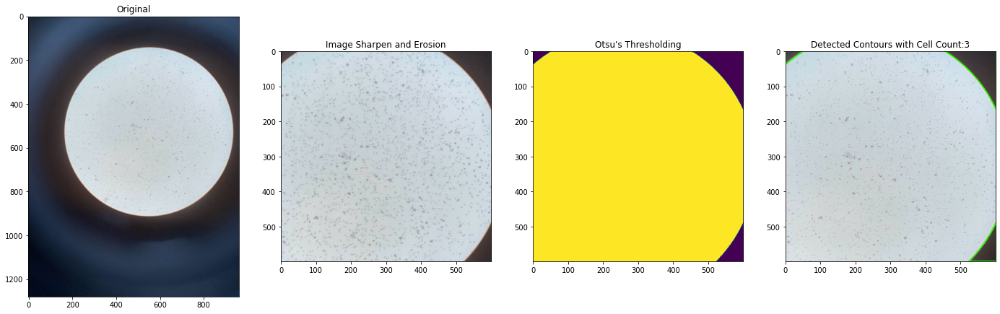

In [ ]:
"""For hemocytometer images (unedited)"""
#image = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/heic_to_png/1.png')
image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/pictures/hemo_unedited.jpg')
#image = cv2.bitwise_not(image) # obtained by inverting image using bitwise_not and saving 
original = image.copy()
height, width, channels = image.shape

y=200
x=300
h=600
w=600
radius = 750
#image = image[height//2-radius:height//2+radius, width//2 - radius: width//2 + radius]
image = cv2.bitwise_not(image)
# use numpy slicing to execute the crop
image = image[y:y+h, x:x+w]
image = cv2.bitwise_not(image)
#original = image.copy()
#image = cv2.bitwise_not(image)

sharpen_filter = np.array([[-1, 0, -1],
	[0, 9, 0],
	[-1, 0, -1]]) 
# helpful to understand what kernels are: https://setosa.io/ev/image-kernels/ (more for me lol)
# can upload image and experiment with kernel values to know what works best
#sharped_img = cv2.filter2D(image, -1, sharpen_filter) # try to sharpen image so cell wall v cell nuclei is distinct
#image = cv2.bitwise_not(sharped_img) # invert image for stronger contrast
kernel = np.ones((2,2),np.uint8)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter
#cv2_imshow(sure_bg)
gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
ret, thresh = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU) # apply otsu threshold
kernel2 = np.ones((1,1),np.uint8)
thresh = cv2.erode(thresh,kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth
#cv2_imshow(thresh)
#fig = plt.gcf()
#fig.set_size_inches(24,16)
#plt.show()

cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

min_area = 0 #set minimum area to 0 as dots are vv small and preprocessing makes sure cell nuclei is brightest
white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs
# can invert to do blob detection but dots becomes smaller + need to set params for blob detection
for c in cnts:
    area = cv2.contourArea(c)
    if area > min_area:
        cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
        white_dots.append(c)

#cv2_imshow(image)
print(len(white_dots))
#imago = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1.png')
#cv2_imshow(imago)

f, axarr = plt.subplots(nrows=1,ncols=4)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')
plt.sca(axarr[2]); 
plt.imshow(thresh); plt.title('Otsu\'s Thresholding')
plt.sca(axarr[3]); 
plt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
#plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_without_sharpening.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(24, 16)
#fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_big_without_sharpening.png', dpi= 100,bbox_inches = 'tight')
plt.show()

### Otsu's Thresholding for Hemocytometer + Webcam Images

1633


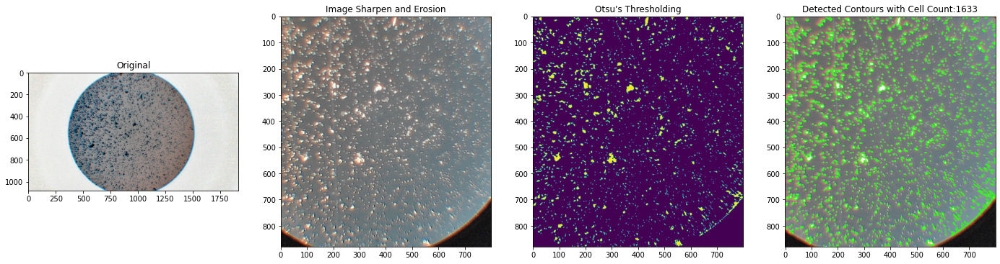

In [ ]:
"""Webcam""" # everything is so bloody disorganised fml TODO: organise notebook akdmclsmvlkdmksmlvkmk
#image = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/heic_to_png/1.png')
#image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/2021-06-24-113253.jpg')
image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/2021-06-24-112856.jpg')
image = cv2.bitwise_not(image) # obtained by inverting image using bitwise_not and saving 
original = image.copy()
height, width, channels = image.shape

y=200
x=600
h=1200
w=800
radius = 750
#image = image[height//2-radius:height//2+radius, width//2 - radius: width//2 + radius]
image = cv2.bitwise_not(image)
# use numpy slicing to execute the crop
image = image[y:y+h, x:x+w]
#image = cv2.bitwise_not(image)
#original = image.copy()
#image = cv2.bitwise_not(image)

sharpen_filter = np.array([[-1, 0, -1],
	[0, 9, 0],
	[-1, 0, -1]]) 
# helpful to understand what kernels are: https://setosa.io/ev/image-kernels/ (more for me lol)
# can upload image and experiment with kernel values to know what works best
#sharped_img = cv2.filter2D(image, -1, sharpen_filter) # try to sharpen image so cell wall v cell nuclei is distinct
#image = cv2.bitwise_not(sharped_img) # invert image for stronger contrast
kernel = np.ones((2,2),np.uint8)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter
#cv2_imshow(sure_bg)
gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
ret, thresh = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU) # apply otsu threshold
kernel2 = np.ones((1,1),np.uint8)
thresh = cv2.erode(thresh,kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth
#cv2_imshow(thresh)
#fig = plt.gcf()
#fig.set_size_inches(24,16)
#plt.show()

cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

min_area = 0 #set minimum area to 0 as dots are vv small and preprocessing makes sure cell nuclei is brightest
white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs
# can invert to do blob detection but dots becomes smaller + need to set params for blob detection
for c in cnts:
    area = cv2.contourArea(c)
    if area > min_area:
        cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
        white_dots.append(c)

#cv2_imshow(image)
print(len(white_dots))
#imago = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1.png')
#cv2_imshow(imago)

f, axarr = plt.subplots(nrows=1,ncols=4)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')
plt.sca(axarr[2]); 
plt.imshow(thresh); plt.title('Otsu\'s Thresholding')
plt.sca(axarr[3]); 
plt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
#plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_without_sharpening_webcam.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(24, 16)
#fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_big_without_sharpening_webcam.png', dpi= 100,bbox_inches = 'tight')
plt.show()

2630


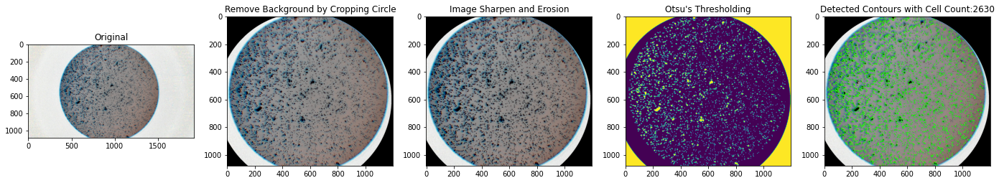

In [ ]:
"""Webcam: try without cropping out circle"""
#image = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/heic_to_png/1.png')
#image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/2021-06-24-113253.jpg')
image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/2021-06-24-112856.jpg')
image = cv2.bitwise_not(image) # obtained by inverting image using bitwise_not and saving 
original = image.copy()
height, width, channels = image.shape

"""y=200
x=600
h=1200
w=800"""
y=0
x=350
h=1600
w=1200
radius = 750
#image = image[height//2-radius:height//2+radius, width//2 - radius: width//2 + radius]
#image = cv2.bitwise_not(image)
# use numpy slicing to execute the crop
image = image[y:y+h, x:x+w]
#image = cv2.bitwise_not(image)
#original = image.copy()
#image = cv2.bitwise_not(image)


######################################
# crop a circle and make pixels outside circle black to avoid interfering with Otsu's Thresholding
# does not need to be perfectly fitted to microscope image to work
hh, ww = image.shape[:2]
hh2 = hh // 2 + 20
ww2 = ww // 2 

# define circles
radius = hh2 + 70
xc = hh2
yc = ww2

# draw filled circle in white on black background as mask
mask = np.zeros_like(image)
mask = cv2.circle(mask, (xc,yc), radius, (255,255,255), -1)

# apply mask to image
image = cv2.bitwise_and(image, mask)
result = image.copy()
################################################

kernel = np.ones((2,2),np.uint8)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter
#cv2_imshow(sure_bg)
gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
ret, thresh = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU) # apply otsu threshold
kernel2 = np.ones((1,1),np.uint8)
thresh = cv2.erode(thresh,kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth
#cv2_imshow(thresh)
#fig = plt.gcf()
#fig.set_size_inches(24,16)
#plt.show()

cnts, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only
#cnts = cnts[0] if len(cnts) == 2 else cnts[1]

min_area = 0 #set minimum area to 0 as dots are vv small and preprocessing makes sure cell nuclei is brightest
white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs
# can invert to do blob detection but dots becomes smaller + need to set params for blob detection
for c in cnts:
    area = cv2.contourArea(c)
    if 1500 > area > min_area:
        cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
        white_dots.append(c)

#cv2_imshow(image)
print(len(white_dots))
#imago = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1.png')
#cv2_imshow(imago)

f, axarr = plt.subplots(nrows=1,ncols=5)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(result); plt.title(f'Remove Background by Cropping Circle')
plt.sca(axarr[2]); 
plt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')
plt.sca(axarr[3]); 
plt.imshow(thresh); plt.title('Otsu\'s Thresholding')
plt.sca(axarr[4]); 
plt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_without_crop_webcam.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(24, 16)
fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/preprocessed_contours_big_without_crop_webcam.png', dpi= 100,bbox_inches = 'tight')
plt.show()

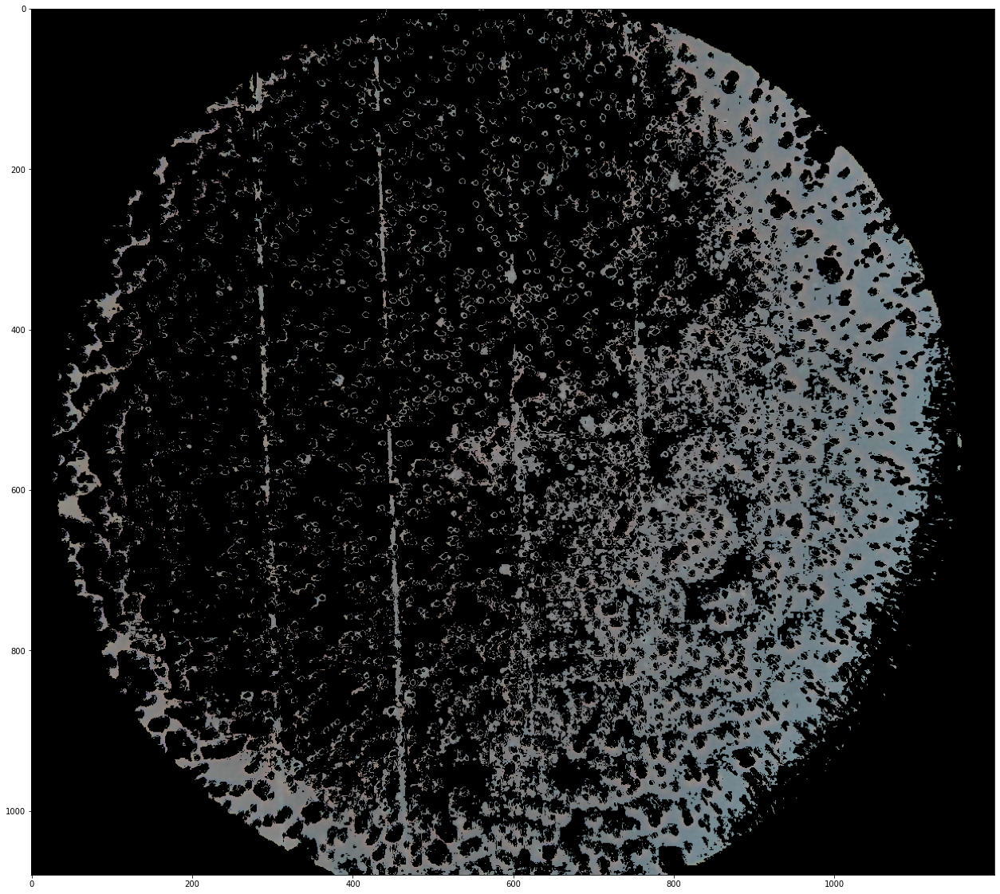

In [ ]:
"""Webcam Gridlines Processing"""
# hemocytometer grid lines are very faint on webcam; find out which preprocessing settings make them the most visible
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import math

image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/2021-06-24-112856.jpg')
#image = cv2.bitwise_not(image)
#img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
y=0
x=350
h=1600
w=1200
image = image[y:y+h, x:x+w]
original = image.copy()
#plt.imshow(img_gray)
fig = plt.gcf()
fig.set_size_inches(30, 20)

lower = np.array([110,120,120])  #-- Lower range --
upper = np.array([150,150,150])  #-- Upper range --
mask = cv2.inRange(image, lower, upper)
res = cv2.bitwise_and(image, image, mask= mask)  #-- Contains pixels having gridline colour--

#print(img_gray[280][370])
#print(img_gray[120][240])

fig.set_size_inches(30, 20)
plt.imshow(res)
fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/rgb_112856.png', dpi= 100,bbox_inches = 'tight')

877


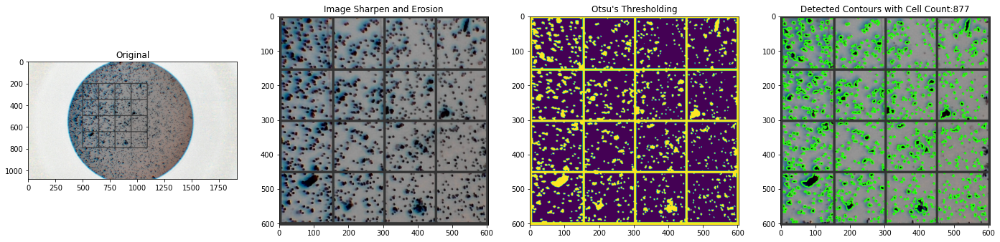

In [ ]:
"""Webcam Gridlines Drawing"""
# TODO figure out how to make alpha mask and make gridlines translucent
# 5 pixels for line thickness
# 148 pixels per 0.25mm / 592 pixels per 1mm

image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/2021-06-24-112856.jpg')
image = cv2.bitwise_not(image) # obtained by inverting image using bitwise_not and saving 
original = image.copy()
height, width, channels = image.shape

y=200
x=500
h=592
w=592

# use numpy slicing to execute the crop
image = image[y:y+h, x:x+w]
kernel = np.ones((2,2),np.uint8)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter

# add bottom and right outermost gridline to ignore cells on these lines
sure_bg = cv2.copyMakeBorder(sure_bg, 0, 5, 0, 5, cv2.BORDER_CONSTANT, value=(52, 52, 52))

gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
ret, thresh = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU) # apply otsu threshold
kernel2 = np.ones((1,1),np.uint8)
thresh = cv2.erode(thresh,kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth

cnts, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only
#cnts = cnts[0] if len(cnts) == 2 else cnts[1]

min_area = 0 #set minimum area to 0 as dots are vv small and preprocessing makes sure cell nuclei is brightest
white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs
# can invert to do blob detection but dots becomes smaller + need to set params for blob detection
for c in cnts:
    area = cv2.contourArea(c)
    if 1500 > area > min_area:
        cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
        white_dots.append(c)

print(len(white_dots))

cv2.rectangle(original, (x, y), (x+w, y+h), (52, 52, 52), 5)
drawBasicGridOriginal(original, 148, (52,52,52),x, x+w,y, y+h)

drawBasicGrid(image, 148, (52, 52, 52))
image = cv2.copyMakeBorder(image, 7, 5, 7, 5, cv2.BORDER_CONSTANT, value=(52, 52, 52))

drawBasicGrid(sure_bg, 148,(52, 52, 52) )
sure_bg = cv2.copyMakeBorder(sure_bg, 7, 0, 7, 0, cv2.BORDER_CONSTANT, value=(52, 52, 52))

drawBasicGrid(thresh, 148, (253, 231, 36))
thresh = cv2.copyMakeBorder(thresh, 7, 0, 7, 0, cv2.BORDER_CONSTANT, value=(253,231,36))

f, axarr = plt.subplots(nrows=1,ncols=4)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')
plt.sca(axarr[2]); 
plt.imshow(thresh); plt.title('Otsu\'s Thresholding')
plt.sca(axarr[3]); 
plt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/webcam_gridlines.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(24, 16)
fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/webcam_gridlines_big.png', dpi= 100,bbox_inches = 'tight')
plt.show()


215


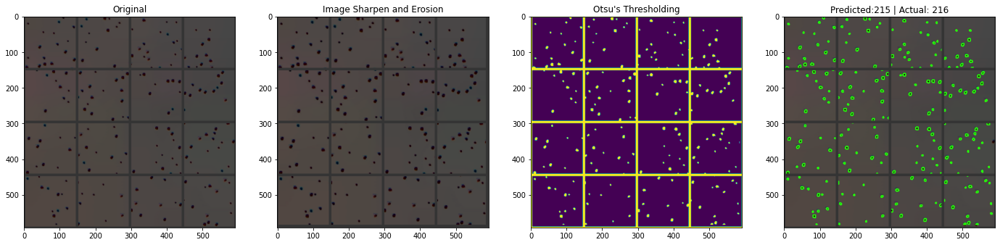

In [ ]:
"""Webcam Gridlines Drawing for Synthetic Images"""

def increase_brightness(img, value=60):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    lim = 255 - value
    v[v > lim] = 255
    v[v <= lim] += value

    final_hsv = cv2.merge((h, s, v))
    img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
    return img

image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/16july_webcam/16july_webcam_1_216.png')
image = increase_brightness(image)
image = cv2.resize(image, (592, 592))
image = cv2.bitwise_not(image) # obtained by inverting image using bitwise_not and saving 
original = image.copy()

x= 0
y= 0
w = 592
h= 592

kernel = np.ones((2,2),np.uint8)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter

# add bottom and right outermost gridline to ignore cells on these lines
#sure_bg = cv2.copyMakeBorder(sure_bg, 0, 15, 0, 15, cv2.BORDER_CONSTANT, value=(52, 52, 52))
cv2.line(sure_bg, (0,sure_bg.shape[0]), (sure_bg.shape[1],sure_bg.shape[0]), color = (52,52,52), thickness = 15) # bottom
cv2.line(sure_bg, (sure_bg.shape[1],sure_bg.shape[0]), (sure_bg.shape[1],0), color = (52,52,52), thickness = 15)

gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
ret, thresh = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU) # apply otsu threshold
kernel2 = np.ones((1,1),np.uint8)
thresh = cv2.erode(thresh,kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth

cnts, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only
#cnts = cnts[0] if len(cnts) == 2 else cnts[1]

min_area = 0 #set minimum area to 0 as dots are vv small and preprocessing makes sure cell nuclei is brightest
white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs
# can invert to do blob detection but dots becomes smaller + need to set params for blob detection
for c in cnts:
    area = cv2.contourArea(c)
    if 1500 > area > min_area:
        cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
        white_dots.append(c)

print(len(white_dots))

cv2.rectangle(original, (x, y), (x+w, y+h), (52, 52, 52), 5)
drawBasicGridOriginal(original, 148, (52,52,52),x, x+w,y, y+h)

drawBasicGrid(image, 148, (52, 52, 52))
#image = cv2.copyMakeBorder(image, 21, 15, 21, 15, cv2.BORDER_CONSTANT, value=(52, 52, 52))

drawBasicGrid(sure_bg, 148,(52, 52, 52) )
#sure_bg = cv2.copyMakeBorder(sure_bg, 21, 0, 21, 0, cv2.BORDER_CONSTANT, value=(52, 52, 52))

drawBasicGrid(thresh, 148, (253, 231, 36))
#thresh = cv2.copyMakeBorder(thresh, 21, 0, 21, 0, cv2.BORDER_CONSTANT, value=(253,231,36))

f, axarr = plt.subplots(nrows=1,ncols=4)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')
plt.sca(axarr[2]); 
plt.imshow(thresh); plt.title('Otsu\'s Thresholding')
plt.sca(axarr[3]); 
plt.imshow(image); plt.title(f'Predicted:{len(white_dots)} | Actual: 216')
plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/test_synthetic_16jul/w_hemo_rules/16july_gridlines_216.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(24, 16)
fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/test_synthetic_16jul/w_hemo_rules/16july_gridlines_big_216.png', dpi= 100,bbox_inches = 'tight')
plt.show()

In [ ]:
def drawBasicGrid(img, pxstep, colour):
    x = pxstep 
    y = pxstep 
    #Draw all x lines
    while x < img.shape[1]:
        cv2.line(img, (x, 0), (x, img.shape[0]), color=colour, thickness=5)
        x += pxstep 
    
    while y < img.shape[0]:
        cv2.line(img, (0, y), (img.shape[1], y), color=colour,thickness=5)
        y += pxstep 

    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = colour, thickness = 5) # bottom 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = colour, thickness = 5) # right
    cv2.line(img, (0,img.shape[0]), (0,0), color = colour, thickness = 5) # left
    cv2.line(img, (0,0), (img.shape[1],0), color = colour, thickness = 5) # top

def drawBasicGridOriginal(img, pxstep, colour, min_x, max_x, min_y, max_y):
    x = pxstep + min_x 
    y = pxstep + min_y 
    #Draw all x lines
    while min_x < x < max_x:
        cv2.line(img, (x, min_y), (x, max_y), color=colour, thickness=5)
        x += pxstep 
    
    while min_y < y < max_y:
        cv2.line(img, (min_x, y), (max_x, y), color=colour,thickness=5)
        y += pxstep 
    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = colour, thickness = 5) # bottom 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = colour, thickness = 5) # right
    cv2.line(img, (0,img.shape[0]), (0,0), color = colour, thickness = 5) # left
    cv2.line(img, (0,0), (img.shape[1],0), color = colour, thickness = 5) # top


In [ ]:
"""Webcam Gridlines (Drawn) V1 Function"""
def v1_contourdetector(image_path, mm_distance = 592, max_area_cells = 1500):
  """
  preprocesses image, performs Otsu's thresholding and connected components detection to derive cell count by hemocytometer method
  excludes cells on outermost bottom and right grid lines
  :param      image_path:  The image file path to jpg
  :param      mm_distance: number of pixels per mm
  :param      max_area_cells: maximum enclosed area that contour detector will accept for it to count as a cell
  returns an integer as the cell count of the image
  """
  image = cv2.imread(image_path)
  image = cv2.bitwise_not(image) 
  height, width, channels = image.shape

  y=200
  x=500

  image = image[y:y+mm_distance, x:x+mm_distance] # use numpy slicing to execute the crop
  kernel = np.ones((2,2),np.uint8)
  sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter

  sure_bg = cv2.copyMakeBorder(sure_bg, 0, 5, 0, 5, cv2.BORDER_CONSTANT, value=(52, 52, 52)) # add bottom and right outermost gridline to ignore cells on these lines

  gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
  ret, thresh = cv2.threshold(
      gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU) # apply otsu threshold
  kernel2 = np.ones((1,1),np.uint8)
  thresh = cv2.erode(thresh,kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth

  cnts, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only

  white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs

  for c in cnts:
      area = cv2.contourArea(c)
      if max_area_cells > area :
          cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
          white_dots.append(c)

  return len(white_dots), image # cell count


V2 photo_2021-07-24_21-40-46.jpg : 101


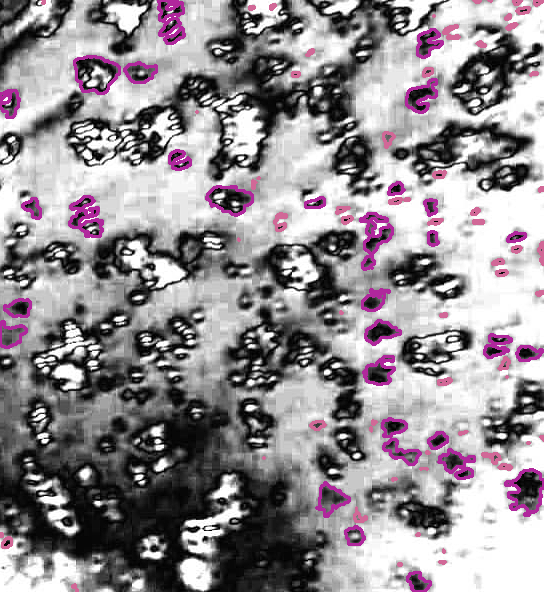

##########
V3 photo_2021-07-24_21-40-46.jpg : 40


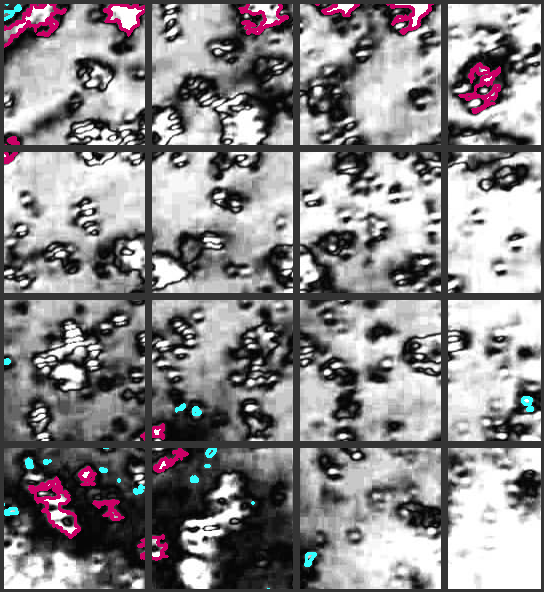

########
V2.2 photo_2021-07-24_21-40-46.jpg : 1282


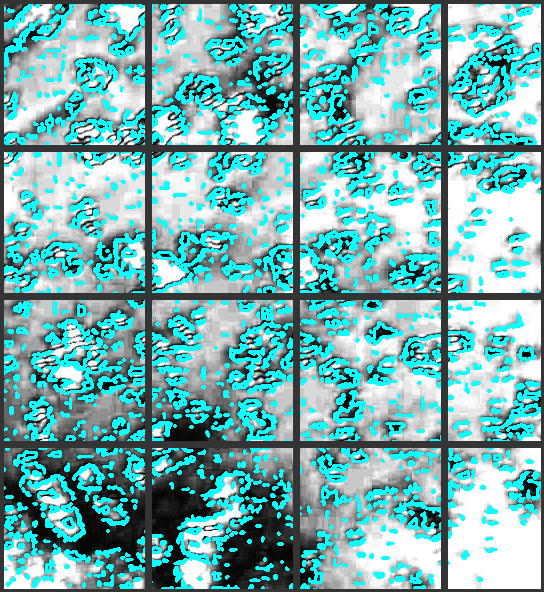

########
V2 20210721_114144_X1.0Y0.0Z0.0.jpg : 45


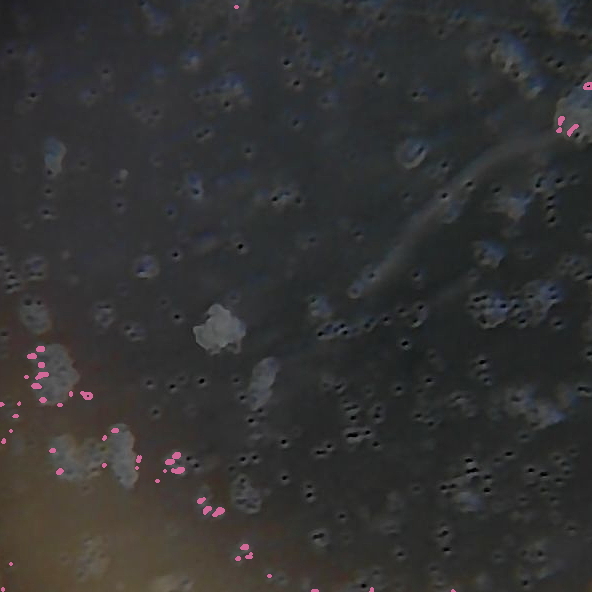

##########
V3 20210721_114144_X1.0Y0.0Z0.0.jpg : 55


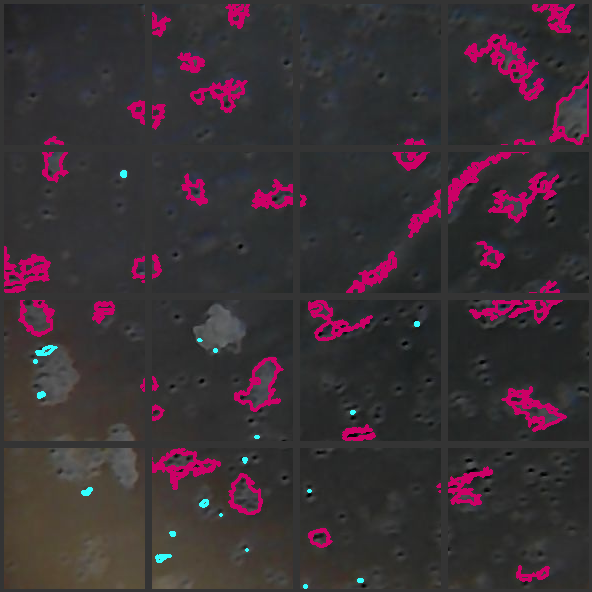

########
V2.2 20210721_114144_X1.0Y0.0Z0.0.jpg : 429


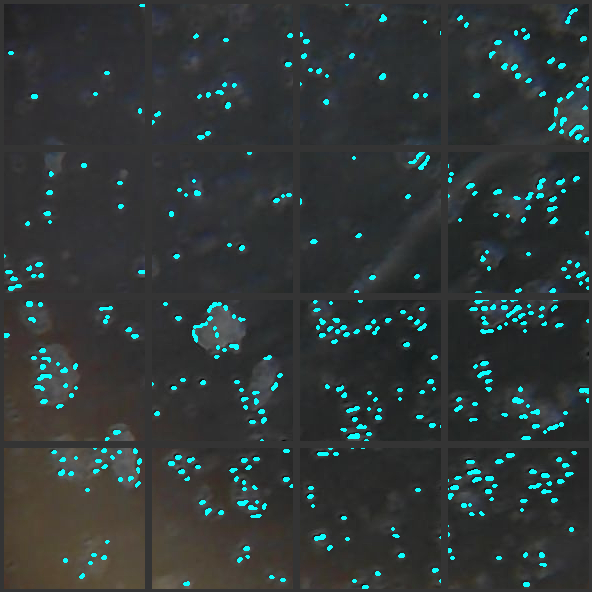

########
V2 photo_2021-07-24_21-47-58.jpg : 198


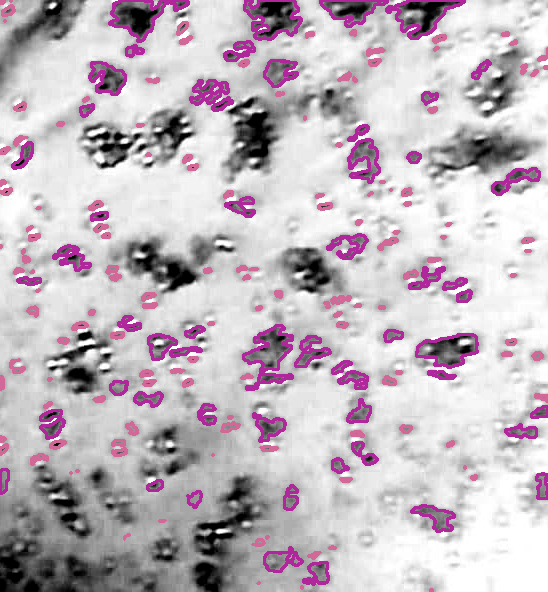

##########
V3 photo_2021-07-24_21-47-58.jpg : 9


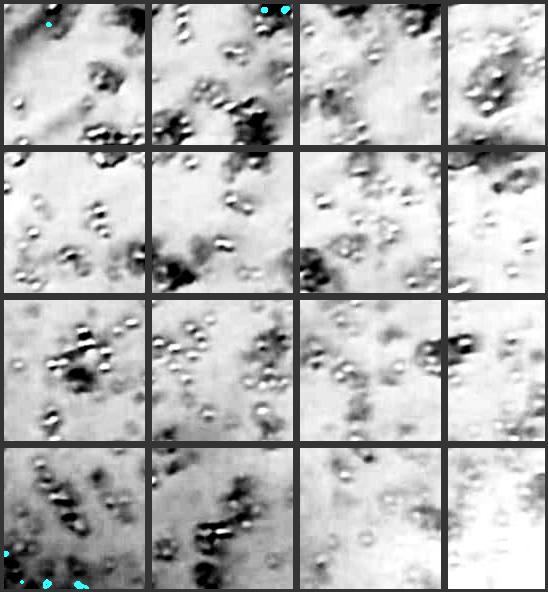

########
V2.2 photo_2021-07-24_21-47-58.jpg : 969


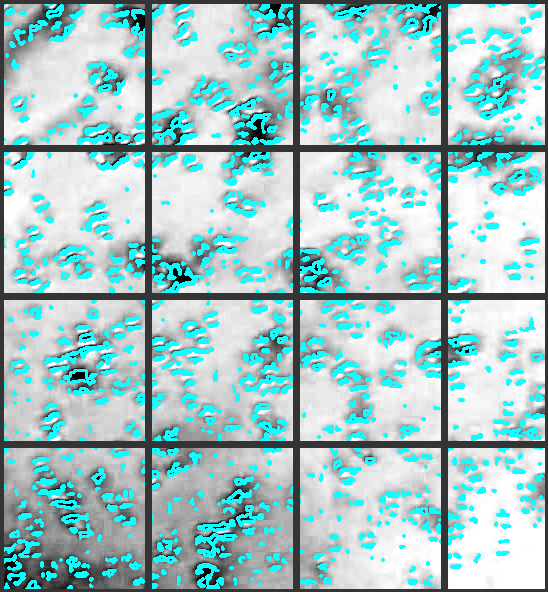

########


In [ ]:
data_dir = '/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/21_july_autofocus/'
data_dir = '/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/21_july_autofocus/'
#data_dir = '/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/20july_webcam/medianBlur9/'
cell_images = ['photo_2021-07-24_21-40-46.jpg','20210721_114144_X1.0Y0.0Z0.0.jpg']
#cell_images = [f for f in os.listdir(data_dir)]
#cell_images = cell_images[-9:]
for cell in cell_images:
  #print(contourdetector('/content/gdrive/MyDrive/CY2003_MnT/synthetic_dataset/synthesised/16july_webcam/16july_webcam_8_477.png'))
  #print(contourdetector('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/20210714_113705.jpg'))
  print(f'V2 {cell} : ' + str(v2_contourdetector(data_dir + cell)[0]))
  cv2_imshow(v2_contourdetector(data_dir + cell, )[1])
  print('##########')
  print(f'V3 {cell} : ' + str(zy_contour(data_dir + cell)[0]))
  cv2_imshow(zy_contour(data_dir + cell)[1])
  print('########')
  print(f'V2.2 {cell} : ' + str(v2_2_contourdetector(data_dir + cell)[0]))
  cv2_imshow(v2_2_contourdetector(data_dir + cell)[1])
  print('########')
  

## V3.3 Repeated Otsu's Thresholding and Connected Components Detection

In [ ]:
def drawBasicGrid(img, pxstep, colour):
    x = pxstep 
    y = pxstep 
    #Draw all x lines
    while x < img.shape[1]:
        cv2.line(img, (x, 0), (x, img.shape[0]), color=colour, thickness=5)
        x += pxstep 
    
    while y < img.shape[0]:
        cv2.line(img, (0, y), (img.shape[1], y), color=colour,thickness=5)
        y += pxstep 

    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = colour, thickness = 5) # bottom 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = colour, thickness = 5) # right
    cv2.line(img, (0,img.shape[0]), (0,0), color = colour, thickness = 5) # left
    cv2.line(img, (0,0), (img.shape[1],0), color = colour, thickness = 5) # top

def drawBasicGridOriginal(img, pxstep, colour, min_x, max_x, min_y, max_y):
    x = pxstep + min_x 
    y = pxstep + min_y 
    #Draw all x lines
    while min_x < x < max_x:
        cv2.line(img, (x, min_y), (x, max_y), color=colour, thickness=5)
        x += pxstep 
    
    while min_y < y < max_y:
        cv2.line(img, (min_x, y), (max_x, y), color=colour,thickness=5)
        y += pxstep 
    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = colour, thickness = 5) # bottom 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = colour, thickness = 5) # right
    cv2.line(img, (0,img.shape[0]), (0,0), color = colour, thickness = 5) # left
    cv2.line(img, (0,0), (img.shape[1],0), color = colour, thickness = 5) # top


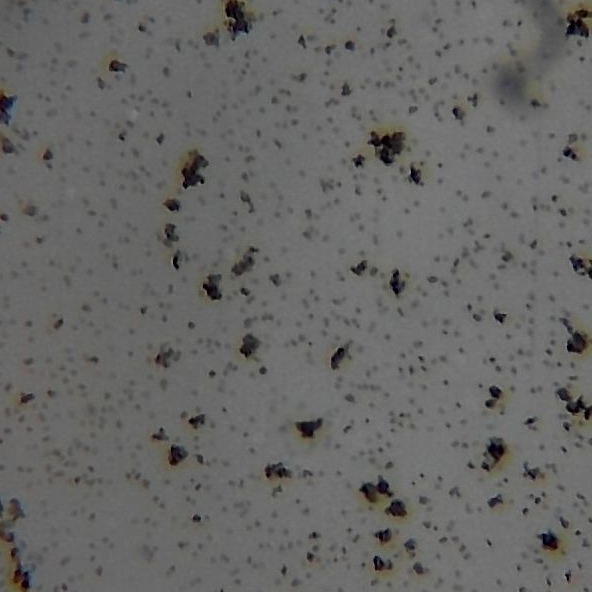

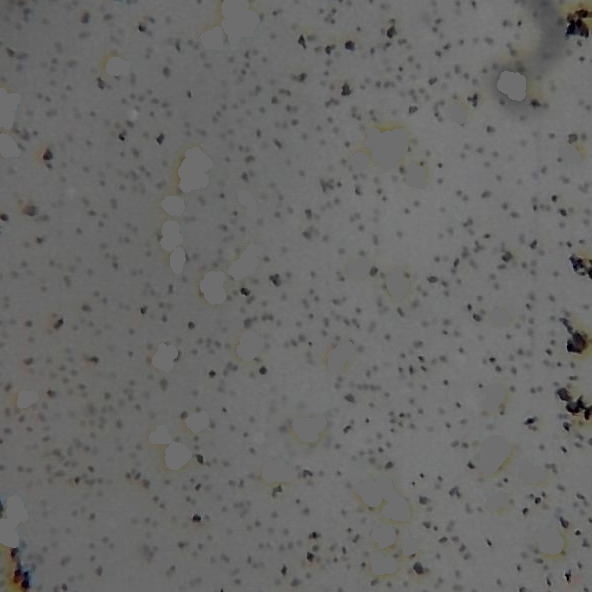

809


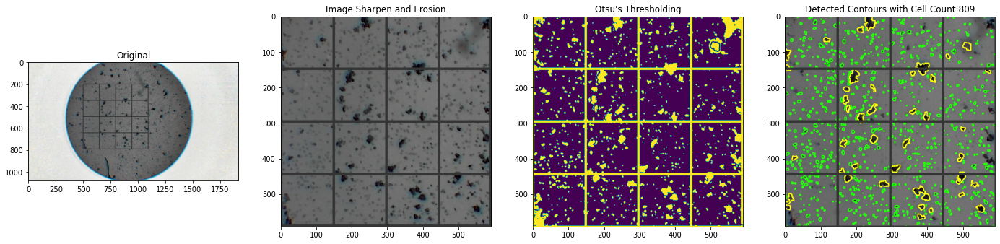

In [ ]:
"""Webcam Gridlines Drawing V2 for Webcam after Debugging"""
# TODO figure out how to make alpha mask and make gridlines translucent
# 5 pixels for line thickness
# 148 pixels per 0.25mm / 592 pixels per 1mm

image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/debug_cellcount_bad/20210714_113705.jpg')
#image = unsharp_mask(image)
image = cv2.bitwise_not(image) # obtained by inverting image using bitwise_not and saving 
original = image.copy()
height, width, channels = image.shape

y=200
x=500
h=592
w=592

# use numpy slicing to execute the crop
image = image[y:y+h, x:x+w]
kernel = np.ones((2,2),np.uint8)
#image = cv2.medianBlur(image, 5)
cv2_imshow(image)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter
"""alpha=1.5
beta=20
sure_bg=cv2.addWeighted(image,alpha,np.zeros(image.shape, image.dtype),0,beta)
cv2_imshow(sure_bg)
sure_bg = cv2.GaussianBlur(sure_bg, (5,5), 0)
cv2_imshow(sure_bg)
"""
# add bottom and right outermost gridline to ignore cells on these lines
cv2.line(sure_bg, (0,sure_bg.shape[0]), (sure_bg.shape[1],sure_bg.shape[0]), color = (52,52,52), thickness = 15) # bottom
cv2.line(sure_bg, (sure_bg.shape[1],sure_bg.shape[0]), (sure_bg.shape[1],0), color = (52,52,52), thickness = 15)

#######################CONTOUR DETECTION FOR LARGE CELLS###############################################################
gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
ret, thresh = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU) # apply otsu threshold
kernel2 = np.ones((1,1),np.uint8)
thresh = cv2.erode(thresh,kernel2,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth

cnts, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only
exclude_large_cells = image.copy()


for c in cnts:
    area = cv2.contourArea(c)
    if 1500 > area > 90:
        cv2.drawContours(exclude_large_cells, [c], -1, (110, 110, 110), cv2.FILLED)
        cv2.drawContours(exclude_large_cells, [c], -1, (110,110,110), 6)

#######################CONTOUR DETECTION FOR SMALL CELLS###############################################################
#exclude_large_cells = cv2.erode(exclude_large_cells,kernel,iterations = 1) 
#exclude_large_cells = cv2.medianBlur(exclude_large_cells, 1)
cv2_imshow(exclude_large_cells)
gray = cv2.cvtColor(exclude_large_cells, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
ret, thresh1 = cv2.threshold(
    gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU) # apply otsu threshold
thresh1 = cv2.erode(thresh1,kernel2,iterations = 1)
cntz, hierarchy1 = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cntz = [cntz[i] for i in range(len(cntz)) if hierarchy1[0][i][2] == -1] # separate lists otherwise cannot restrict contour area to avoid counting noise

white_dots = [] 
#######################DRAW CONTOURS FOR LARGE AND SMALL CELLS#########################################################
for c in cntz: 
    area = cv2.contourArea(c)
    if 90 > area > 0:
        cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
        white_dots.append(c)

for c in cnts:
    area = cv2.contourArea(c)
    if 1500 > area > 90:
        cv2.drawContours(image, [c], -1, (255, 255, 12), 2)
        white_dots.append(c)

print(len(white_dots))

# overlay thresholding for large and small cells
thresh[thresh[:, :].all(axis=-1)] = 0
thresh1[thresh1[:, :].all(axis=-1)] = 0
finalthresh = cv2.addWeighted(thresh, 1, thresh1, 1, 0)

cv2.rectangle(original, (x, y), (x+w, y+h), (52, 52, 52), 5)
drawBasicGridOriginal(original, 148, (52,52,52),x, x+w,y, y+h)

drawBasicGrid(image, 148, (52, 52, 52))

drawBasicGrid(sure_bg, 148,(52, 52, 52) )

drawBasicGrid(finalthresh, 148, (253, 231, 36))

f, axarr = plt.subplots(nrows=1,ncols=4)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')
plt.sca(axarr[2]); 
plt.imshow(finalthresh); plt.title('Otsu\'s Thresholding')
plt.sca(axarr[3]); 
plt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
#plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/webcam_gridlines.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(24, 16)
fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/webcam_gridlines_big_v2_withoutunsharp.png', dpi= 100,bbox_inches = 'tight')
plt.show()

873


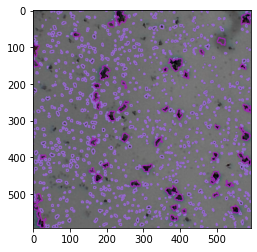

In [ ]:
######### V2 Contour Detector Function #################
import cv2
import datetime
import numpy as np

def drawBasicGrid(img, pxstep, colour):
    """
    adds horizontal and vertical lines on image input to mimic hemocytometer gridlines
    :param      img: 3d matrix of image
    :param      pxstep: pixel distance between gridlines
    :param      colour: colour of lines in RGB
    """
    x = pxstep 
    y = pxstep 
    #Draw all x lines
    while x < img.shape[1]:
        cv2.line(img, (x, 0), (x, img.shape[0]), color=colour, thickness=5)
        x += pxstep 
    
    # Draw all y lines
    while y < img.shape[0]:
        cv2.line(img, (0, y), (img.shape[1], y), color=colour,thickness=5)
        y += pxstep 
    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = colour, thickness = 5) # bottom 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = colour, thickness = 5) # right
    cv2.line(img, (0,img.shape[0]), (0,0), color = colour, thickness = 5) # left
    cv2.line(img, (0,0), (img.shape[1],0), color = colour, thickness = 5) # top

def drawBottomRightLines(img):
    # add bottom and right outermost gridline to ignore cells on these lines
    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = (52,52,52), thickness = 5) 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = (52,52,52), thickness = 5)
 
def thresholdingPreprocessing(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
    ret, thresh = cv2.threshold(
      gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU) # apply otsu threshold
    kernel = np.ones((1,1),np.uint8)
    thresh = cv2.erode(thresh,kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth
    return thresh


def v2_contourdetector(image_path, mm_distance = 592, max_area_cells = 1500):
  """
  preprocesses image, performs Otsu's thresholding and connected components detection to derive cell count by hemocytometer method
  excludes cells on outermost bottom and right grid lines
  :param      image_path:  The image file path to jpg
  :param      mm_distance: number of pixels per mm
  :param      max_area_cells: maximum enclosed area that contour detector will accept for it to count as a cell
  returns an integer as the cell count of the image and gridded image with detected contours
  """
  image = cv2.imread(image_path)
  image = unsharp_mask(image)
  image = cv2.bitwise_not(image) 

  y=200
  x=500

  image = image[y:y+mm_distance, x:x+mm_distance] # use numpy slicing to execute the crop
  kernel = np.ones((2,2),np.uint8)
  sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter

  ############### Contour Detection for Large Cells ###############
  
  #drawBottomRightLines(sure_bg)

  thresh = thresholdingPreprocessing(sure_bg)

  cnts, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only
  
  ############### Contour Detection for Small Cells ###############

  # exclude large cells
  exclude_large_cells = image.copy()
  for c in cnts:
    area = cv2.contourArea(c)
    if 1500 > area > 90:
        cv2.drawContours(exclude_large_cells, [c], -1, (110, 110, 110), cv2.FILLED) # isolate small cells by removing large cells
        cv2.drawContours(exclude_large_cells, [c], -1, (110,110,110), 6) # draw border
  
  # contour detection
  thresh_small = thresholdingPreprocessing(exclude_large_cells)

  cnt_small, hierarchy_small = cv2.findContours(thresh_small, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnt_small = [cnt_small[i] for i in range(len(cnt_small)) if hierarchy_small[0][i][2] == -1] 

  ############### Contour Drawing for All Cells #######################
  white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs

  for c in cnt_small: 
    area = cv2.contourArea(c)
    if 90 > area > 0:
        cv2.drawContours(image, [c], -1, (151,104,209), 2)
        white_dots.append(c)

  for c in cnts:
      area = cv2.contourArea(c)
      if max_area_cells > area > 90 :
          cv2.drawContours(image, [c], -1, (156, 39, 176), 2)
          white_dots.append(c)

  #drawBasicGrid(image, 148, (52, 52, 52)) # draw vertical and horizontal lines

  return len(white_dots), image # returns cell count and image with drawn contours

plt.imshow(v2_contourdetector('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/debug_cellcount_bad/20210714_113705.jpg')[1])
#cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/testrun_nominarea.jpg', contourdetector('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/debug_cellcount_bad/20210714_113705.jpg')[1])
print(v2_contourdetector('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/debug_cellcount_bad/20210714_113705.jpg')[0])

## V3.4 Repeated Static Thresholding and Connected Components Detection

In [ ]:
############ Static Thresholding Contour Detector Function #################
import matplotlib.pyplot as plt
import cv2
import datetime
import numpy as np

def drawBasicGrid(img, pxstep, colour):
    """
    adds horizontal and vertical lines on image input to mimic hemocytometer gridlines
    :param      img: 3d matrix of image
    :param      pxstep: pixel distance between gridlines
    :param      colour: colour of lines in RGB
    """
    x = pxstep 
    y = pxstep 
    #Draw all x lines
    while x < img.shape[1]:
        cv2.line(img, (x, 0), (x, img.shape[0]), color=colour, thickness=5)
        x += pxstep 
    
    # Draw all y lines
    while y < img.shape[0]:
        cv2.line(img, (0, y), (img.shape[1], y), color=colour,thickness=5)
        y += pxstep 
    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = colour, thickness = 5) # bottom 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = colour, thickness = 5) # right
    cv2.line(img, (0,img.shape[0]), (0,0), color = colour, thickness = 5) # left
    cv2.line(img, (0,0), (img.shape[1],0), color = colour, thickness = 5) # top

def drawBottomRightLines(img):
    # add bottom and right outermost gridline to ignore cells on these lines
    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = (52,52,52), thickness = 5) 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = (52,52,52), thickness = 5)
 
def thresholdingPreprocessing(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # convert to grayscale for Otsu's thresholding
    ret, thresh = cv2.threshold(
      gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU) # apply otsu threshold
    kernel = np.ones((1,1),np.uint8)
    thresh = cv2.erode(thresh,kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth
    return thresh


def oldv2_contourdetector(image_path, mm_distance = 592, max_area_cells = 1500):
  """
  preprocesses image, performs Otsu's thresholding and connected components detection to derive cell count by hemocytometer method
  excludes cells on outermost bottom and right grid lines
  :param      image_path:  The image file path to jpg
  :param      mm_distance: number of pixels per mm
  :param      max_area_cells: maximum enclosed area that contour detector will accept for it to count as a cell
  returns an integer as the cell count of the image and gridded image with detected contours
  """
  image = cv2.imread(image_path)
  image = cv2.bitwise_not(image) 

  y=200
  x=500

  image = image[y:y+mm_distance, x:x+mm_distance] # use numpy slicing to execute the crop
  kernel = np.ones((2,2),np.uint8)
  sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter

  ############### Contour Detection for Large Cells ###############
  
  drawBottomRightLines(sure_bg)

  thresh = thresholdingPreprocessing(sure_bg)

  cnts, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only
  
  ############### Contour Detection for Small Cells ###############

  # exclude large cells
  exclude_large_cells = image.copy()
  for c in cnts:
    area = cv2.contourArea(c)
    if 1500 > area > 90:
        cv2.drawContours(exclude_large_cells, [c], -1, (110, 110, 110), cv2.FILLED) # isolate small cells by removing large cells
        cv2.drawContours(exclude_large_cells, [c], -1, (110,110,110), 6) # draw border
  
  # contour detection
  thresh_small = thresholdingPreprocessing(exclude_large_cells)

  cnt_small, hierarchy_small = cv2.findContours(thresh_small, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnt_small = [cnt_small[i] for i in range(len(cnt_small)) if hierarchy_small[0][i][2] == -1] 

  ############### Contour Drawing for All Cells #######################
  white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs

  for c in cnt_small: 
    area = cv2.contourArea(c)
    if 90 > area > 0:
        cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
        white_dots.append(c)

  for c in cnts:
      area = cv2.contourArea(c)
      if max_area_cells > area > 90 :
          cv2.drawContours(image, [c], -1, (36, 255, 12), 2)
          white_dots.append(c)

  drawBasicGrid(image, 148, (52, 52, 52)) # draw vertical and horizontal lines

  return len(white_dots), image # returns cell count and image with drawn contours


def lookup_curve(img, i = 0):

	kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
	img = cv2.filter2D(img, -1, kernel)
	img = unsharp_mask(img)
	thresh = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

	lut_in = np.array([0, 93, 126, 255])
	lut_out = np.array([255, 73, 0, 0])

	lut_8u = np.interp(np.arange(0,256), lut_in, lut_out).astype(np.uint8)

	#print(lut_8u)

	thresh = cv2.LUT(thresh, lut_8u)
	if i == 0:
		ret, thresh = cv2.threshold(thresh, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
	else:
		ret, thresh = cv2.threshold(thresh, i, 255, cv2.THRESH_BINARY_INV)
	kernel = np.ones((1,1),np.uint8)
	thresh = cv2.erode(thresh, kernel,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth

	thresh = cv2.bitwise_not(thresh)
	return thresh

def unsharp_mask(image, kernel_size=(3, 3), sigma=1.0, amount=0.5, threshold=0):
	"""Return a sharpened version of the image, using an unsharp mask."""
	blurred = cv2.GaussianBlur(image, kernel_size, sigma)
	sharpened = float(amount + 1) * image - float(amount) * blurred
	sharpened = np.maximum(sharpened, np.zeros(sharpened.shape))
	sharpened = np.minimum(sharpened, 255 * np.ones(sharpened.shape))
	sharpened = sharpened.round().astype(np.uint8)
	if threshold > 0:
		low_contrast_mask = np.absolute(image - blurred) < threshold
		np.copyto(sharpened, image, where=low_contrast_mask)
	return sharpened

def zy_contour(image_path, mm_distance = 592, max_area_cells = 1500, debug = False, static = 0):
	"""
	preprocesses image, performs Otsu's thresholding and connected components detection to derive cell count by hemocytometer method
	excludes cells on outermost bottom and right grid lines
	:param      image_path:  The image file path to jpg
	:param      mm_distance: number of pixels per mm
	:param      max_area_cells: maximum enclosed area that contour detector will accept for it to count as a cell
	returns an integer as the cell count of the image and gridded image with detected contours
	"""
	image = cv2.imread(image_path)
	image = cv2.bitwise_not(image) 
	original = image.copy()
	h, w, _ = image.shape

	y=200
	x=500

	#y=int(image.shape[0]/2 - mm_distance/2)
	#x=int(image.shape[1]/2 - mm_distance/2)

	image = image[y:y+mm_distance, x:x+mm_distance] # use numpy slicing to execute the crop
	kernel = np.ones((2,2),np.uint8)
	sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter

	

	############### Contour Detection for Large Cells ###############

	drawBottomRightLines(sure_bg)

	#thresh = thresholdingPreprocessing(sure_bg, otsu = False, static = 55)
	thresh = lookup_curve(sure_bg, static)	

	cnts, hierarchy = cv2.findContours(255-thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
	#print(cnts)
	cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only

	############### Contour Detection for Small Cells ###############

	# exclude large cells
	exclude_large_cells = image.copy()
	for c in cnts:
		area = cv2.contourArea(c)
		if 1500 > area > 90:
			cv2.drawContours(exclude_large_cells, [c], -1, (110, 110, 110), cv2.FILLED) # isolate small cells by removing large cells
			cv2.drawContours(exclude_large_cells, [c], -1, (110,110,110), 6) # draw border

	# contour detection
	#exclude_large_cells = cv2.medianBlur(exclude_large_cells,3)
	#thresh_small = thresholdingPreprocessing(exclude_large_cells)
	thresh_small = lookup_curve(exclude_large_cells, static)
	thresh_small = cv2.medianBlur(thresh_small,7)
	#thresh_small = cv2.medianBlur(thresh_small,3)
	kernel = np.ones((1,1),np.uint8)
	thresh_small = cv2.erode(thresh_small,kernel,iterations = 1) # apply erosion filter

	cnt_small, hierarchy_small = cv2.findContours(255-thresh_small, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
	#print(cnt_small)
	cnt_small = [cnt_small[i] for i in range(len(cnt_small)) if hierarchy_small[0][i][2] == -1] 

	############### Contour Drawing for All Cells #######################
	white_dots = [] # used contours as blob detection is more suited for detecting black or grey blobs

	for c in cnt_small: 
		area = cv2.contourArea(c)
		if 90 > area > 0:
			cv2.drawContours(image, [c], -1, (255, 255, 51), 2)
			white_dots.append(c)

	for c in cnts:
		area = cv2.contourArea(c)
		if max_area_cells > area > 90 :
			cv2.drawContours(image, [c], -1, (102, 0, 204), 2)
			white_dots.append(c)

	drawBasicGrid(image, 148, (52, 52, 52)) # draw vertical and horizontal lines

	#output_path = "app/static/capture/{}.jpg".format(datetime.datetime.now(), "%Y%m%d-%H%M%S")

	if debug:
    # overlay thresholding for large and small cells
		thresh[thresh[:, :].all(axis=-1)] = 0
		thresh_small[thresh_small[:, :].all(axis=-1)] = 0
		finalthresh = cv2.addWeighted(thresh, 1, thresh_small, 1, 0)

		f, axarr = plt.subplots(nrows=2,ncols=2)
		plt.sca(axarr[0, 0]); 
		plt.imshow(original, cmap = "binary"); plt.title('Original')
		plt.sca(axarr[0, 1]); 
		plt.imshow(sure_bg, cmap = "binary"); plt.title('Image Sharpen and Erosion')
		plt.sca(axarr[1 ,0]); 
		plt.imshow(finalthresh, cmap = "binary"); plt.title('Thresholding')
		plt.sca(axarr[1, 1]); 
		plt.imshow(image, cmap = "binary"); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
		fig = plt.gcf()       
		fig.set_size_inches(8,6)
		fig.set_dpi(150)
		fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/v3_staticthresholding/erosion_second_run.png',bbox_inches = 'tight')
		plt.show()

	return len(white_dots), image # returns cell count and image with drawn contours

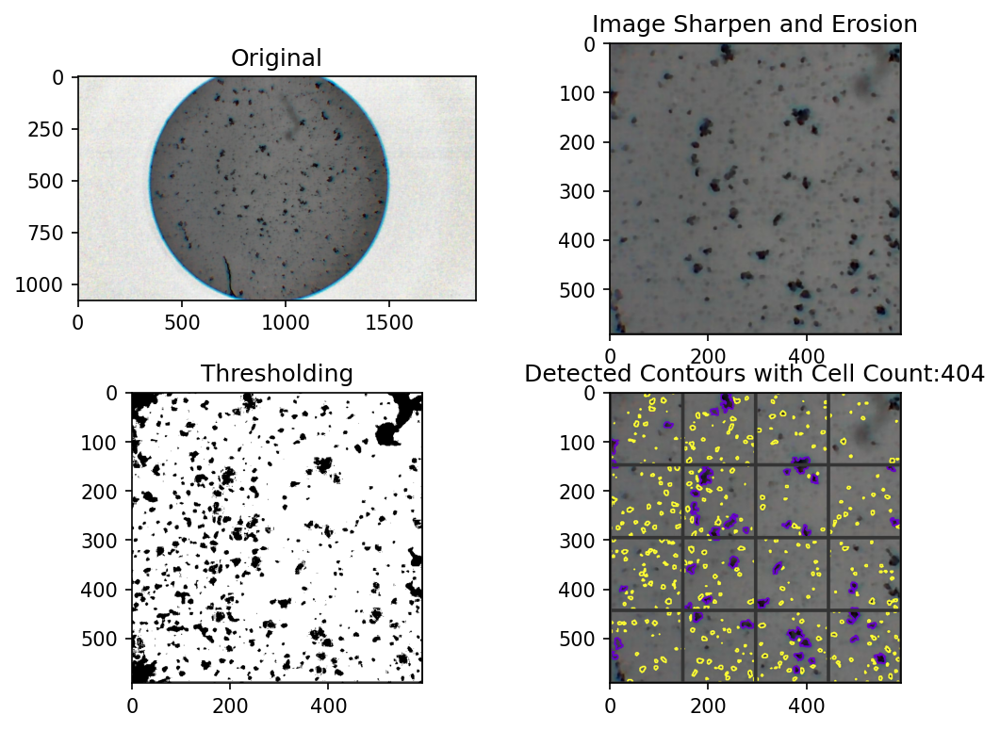

V3 20210714_113753.jpg : 404
V2 20210714_113753.jpg : 295


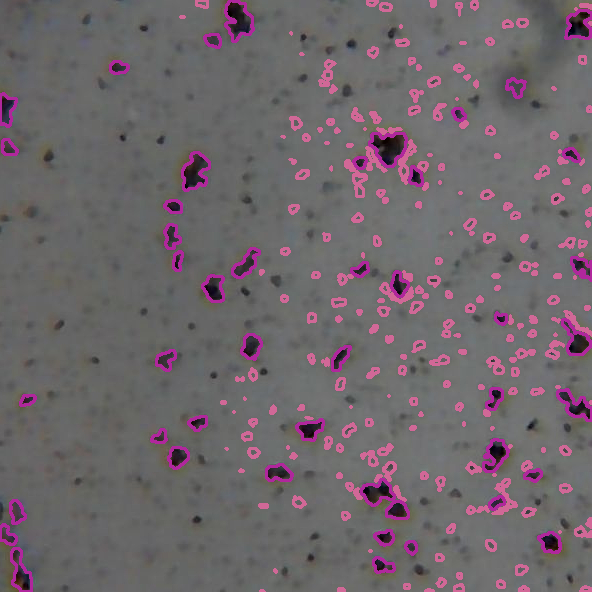

In [ ]:
data_dir = '/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/debug_cellcount_bad/20210714_113753.jpg'
str(zy_contour(data_dir)[0])
#print(f'V2 {cell} : ' + str(v2_contourdetector(data_dir)[0])) # for comparison
#cv2_imshow(v2_contourdetector(data_dir)[1])


## V3.5 Adaptive Gaussian Thresholding and Connected Components Detection

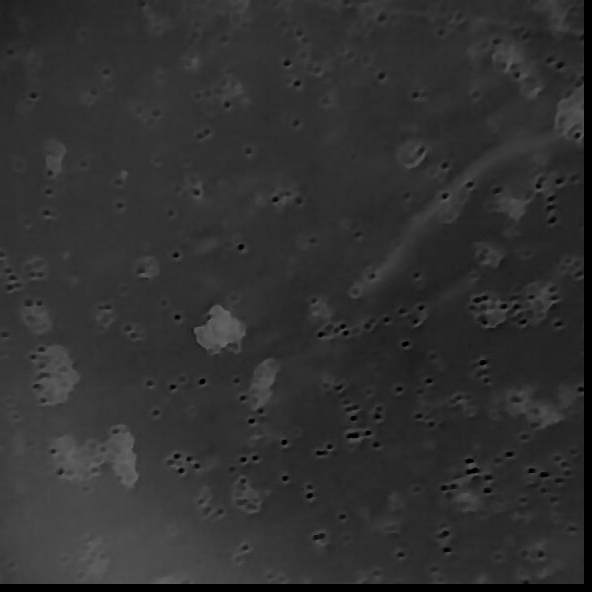

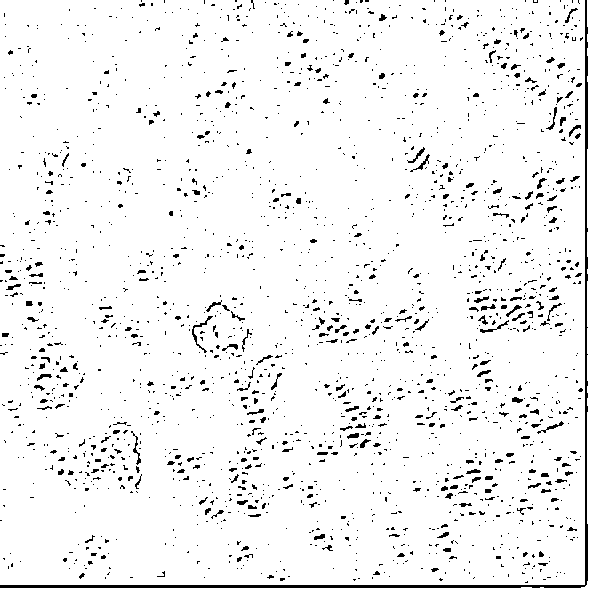

880


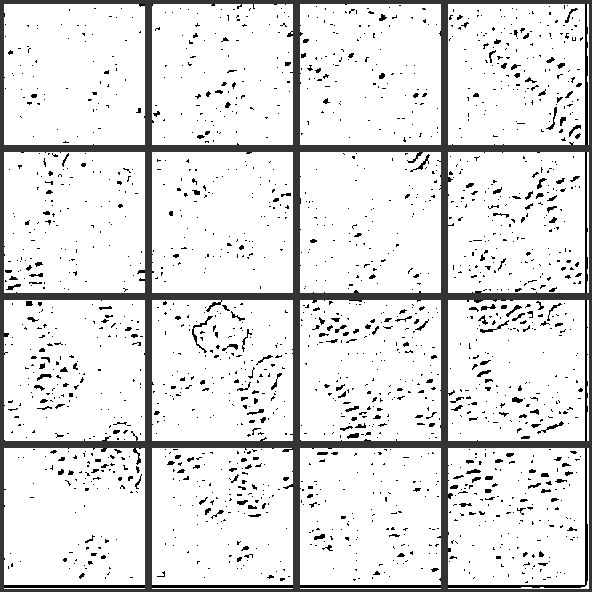

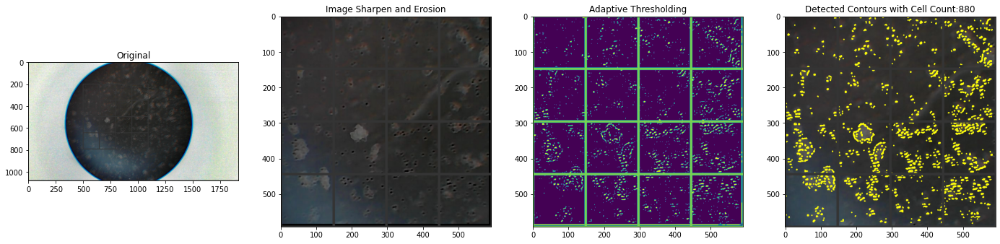

In [ ]:
"""V2.2 Trying out Adaptive Thresholding Methods Contour Detector"""
# TODO figure out how to make alpha mask and make gridlines translucent
# 5 pixels for line thickness
# 148 pixels per 0.25mm / 592 pixels per 1mm

image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/21_july_autofocus/20210721_114144_X1.0Y0.0Z0.0.jpg')
image = unsharp_mask(image)
image = cv2.bitwise_not(image) # obtained by inverting image using bitwise_not and saving 
original = image.copy()
height, width, channels = image.shape

y=200
x=500
h=592
w=592

# use numpy slicing to execute the crop
image = image[y:y+h, x:x+w]
kernel = np.ones((2,2),np.uint8)
#image = cv2.medianBlur(image, 5)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter

# add bottom and right outermost gridline to ignore cells on these lines
cv2.line(sure_bg, (0,sure_bg.shape[0]), (sure_bg.shape[1],sure_bg.shape[0]), color = (0,0,0), thickness = 15) # bottom
cv2.line(sure_bg, (sure_bg.shape[1],sure_bg.shape[0]), (sure_bg.shape[1],0), color = (0,0,0), thickness = 15)

gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for thresholding

cv2_imshow(gray)
thresh = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)
kernel2 = np.ones((2,2),np.uint8)
thresh = cv2.dilate(thresh,kernel2,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth
cv2_imshow(thresh)
cnts, hierarchy = cv2.findContours(255-thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only

white_dots = [] 

for c in cnts:
    area = cv2.contourArea(c)
    if 300 > area > 0:
        cv2.drawContours(image, [c], -1, (255, 255, 12), 2)
        white_dots.append(c)

print(len(white_dots))

cv2.rectangle(original, (x, y), (x+w, y+h), (52, 52, 52), 5)
drawBasicGridOriginal(original, 148, (52,52,52),x, x+w,y, y+h)

drawBasicGrid(image, 148, (52, 52, 52))

drawBasicGrid(sure_bg, 148,(52, 52, 52) )

drawBasicGrid(thresh, 148, (52,52,52))
cv2_imshow(thresh)

f, axarr = plt.subplots(nrows=1,ncols=4)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')
plt.sca(axarr[2]); 
plt.imshow(255-thresh); plt.title('Adaptive Thresholding')
plt.sca(axarr[3]); 
plt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
#plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/webcam_gridlines.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(24, 16)
fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/v2.2_adaptivethresholding/21july_autofocus_unsharp_dilate2.png', dpi= 100,bbox_inches = 'tight')
plt.show()

In [ ]:
import cv2
import datetime
import numpy as np


def drawBasicGrid(img, pxstep, colour):
    """
    adds horizontal and vertical lines on image input to mimic hemocytometer gridlines
    :param      img: 3d matrix of image
    :param      pxstep: pixel distance between gridlines
    :param      colour: colour of lines in RGB
    """
    x = pxstep 
    y = pxstep 
    #Draw all x lines
    while x < img.shape[1]:
        cv2.line(img, (x, 0), (x, img.shape[0]), color=colour, thickness=5)
        x += pxstep 
    
    # Draw all y lines
    while y < img.shape[0]:
        cv2.line(img, (0, y), (img.shape[1], y), color=colour,thickness=5)
        y += pxstep 
    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = colour, thickness = 5) # bottom 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = colour, thickness = 5) # right
    cv2.line(img, (0,img.shape[0]), (0,0), color = colour, thickness = 5) # left
    cv2.line(img, (0,0), (img.shape[1],0), color = colour, thickness = 5) # top

def drawBottomRightLines(img):
    # add bottom and right outermost gridline to ignore cells on these lines
    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = (52,52,52), thickness = 5) 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = (52,52,52), thickness = 5)

def unsharp_mask(image, kernel_size=(3, 3), sigma=1.0, amount=0.5, threshold=0):
	"""Return a sharpened version of the image, using an unsharp mask."""
	blurred = cv2.GaussianBlur(image, kernel_size, sigma)
	sharpened = float(amount + 1) * image - float(amount) * blurred
	sharpened = np.maximum(sharpened, np.zeros(sharpened.shape))
	sharpened = np.minimum(sharpened, 255 * np.ones(sharpened.shape))
	sharpened = sharpened.round().astype(np.uint8)
	if threshold > 0:
		low_contrast_mask = np.absolute(image - blurred) < threshold
		np.copyto(sharpened, image, where=low_contrast_mask)
	return sharpened

def v2_2_contourdetector(image_path, mm_distance = 592, max_area_cells = 800):
  """
  preprocesses image, performs adaptive Gaussian thresholding and connected components detection to derive cell count by hemocytometer method
  excludes cells on outermost bottom and right grid lines
  :param      image_path:  The image file path to jpg
  :param      mm_distance: number of pixels per mm
  :param      max_area_cells: maximum enclosed area that contour detector will accept for it to count as a cell
  returns an integer as the cell count of the image and gridded image with detected contours
  """
  image = cv2.imread(image_path)
  image = unsharp_mask(image)
  image = cv2.bitwise_not(image) 

  y=200
  x=500

  image = image[y:y+mm_distance, x:x+mm_distance] # use numpy slicing to execute the crop
  kernel = np.ones((2,2),np.uint8)
  sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter

  drawBottomRightLines(sure_bg)

  gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for thresholding
  thresh = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2) # adaptive thresholding
  kernel2 = np.ones((2,2),np.uint8)
  thresh = cv2.dilate(thresh,kernel2,iterations = 1) # apply dilation to avoid disconnected contours

  cnts, hierarchy = cv2.findContours(255-thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only

  white_dots = [] 

  for c in cnts:
      area = cv2.contourArea(c)
      if max_area_cells > area > 0:
          cv2.drawContours(image, [c], -1, (255, 255, 12), 2)
          white_dots.append(c)


  drawBasicGrid(image, 148, (52, 52, 52)) # draw vertical and horizontal lines

  return len(white_dots), image # returns cell count and image with drawn contours

[[101 101 102 103 102 100  98  95  94  94  96  85  72  68  68  76  86 100
  102 103 103 103 103 100  96  93  91  91  91  95  97  95  88  88  91  95
   99 101 103 103 103  95  78  68  64  63  63  63  66  69  68  65  64  61
   61  69  92  99 100 102 101 101 101 102 103 104 104 105 107 104 101 101
  102 105 106 106 107 107 106 106 103 103 105 105 106 106 105 105 105 109
  109 109 108 108 107 107 107 109 110 108 105 105 105 105 105 105 106 108
  111 109 107 105 105 108 108 107 107 107 107 107 107 108 108 108 108 108
  109 109 107 107 108 108 109 112 105  97  89  81  59  43  43  56  89 111
  111 110 110 110 110 110 110 110 109 110 109 109 109 109 108 108 108 110
  110 104 102 102 104 102  91  91  91  93  96 104 110 111 104 104 107 107
   93  54  22  18  18  35  35  41  50  56  63  84 103 106 105 104 104 104
  105 106 107 107 107 107 107 109 110 111 111 113 111 109 106 101  99  95
   95 102 100  97  90  79  66  59  52  52  61  77  91 105 110 105 105 109
   99  93  90  90  95 101 107 107 107 

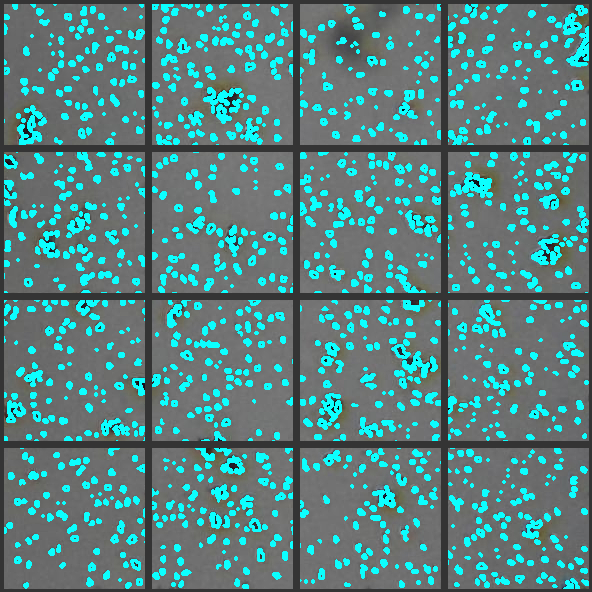

In [ ]:
#sharpened = float(1)*image - float(1)*blurred + float(amount)*blurred + float(amount)*image
#sharpened = mask + float(amount)*blurred + float(amount)*image
def unsharp_mask(image, kernel_size=(3, 3), sigma=1.0, amount=0.5, threshold=0):
	"""Return a sharpened version of the image, using an unsharp mask."""
	blurred = cv2.GaussianBlur(image, kernel_size, sigma)
	cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/preprocessing_sharpen_blurred.png', blurred)
	sharpened = float(amount + 1) * image - float(amount) * blurred
	cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/preprocessing_sharpen_amount0.5.png', float(amount)*image)
	cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/preprocessing_sharpen_unsharpmask.png', image - blurred)
	sharpened = np.maximum(sharpened, np.zeros(sharpened.shape)) #convert negative values to 0
	sharpened = np.minimum(sharpened, 255 * np.ones(sharpened.shape)) 
	sharpened = sharpened.round().astype(np.uint8)
	if threshold > 0:
		low_contrast_mask = np.absolute(image - blurred) < threshold
		np.copyto(sharpened, image, where=low_contrast_mask)
	return sharpened

def drawBottomRightLines(img):
    # add bottom and right outermost gridline to ignore cells on these lines
    cv2.line(img, (0,img.shape[0]), (img.shape[1],img.shape[0]), color = (52,52,52), thickness = 5) 
    cv2.line(img, (img.shape[1],img.shape[0]), (img.shape[1],0), color = (52,52,52), thickness = 5)

def v2_2_4slides(image_path, mm_distance = 592, max_area_cells = 800):
  """
  preprocesses image, performs adaptive Gaussian thresholding and connected components detection to derive cell count by hemocytometer method
  excludes cells on outermost bottom and right grid lines
  :param      image_path:  The image file path to jpg
  :param      mm_distance: number of pixels per mm
  :param      max_area_cells: maximum enclosed area that contour detector will accept for it to count as a cell
  returns an integer as the cell count of the image and gridded image with detected contours
  """
  image = cv2.imread(image_path)
  original = image.copy()
  y=int(image.shape[0]/2 - mm_distance/2)
  x=int(image.shape[1]/2 - mm_distance/2)
 
  #cv2.rectangle(original, (x, y), (x+mm_distance, y+mm_distance), (52, 52, 52), 5)
  #drawBasicGridOriginal(original,148, (52,52,52),x, x+mm_distance, y, y+mm_distance)
  cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/preprocessing_original.png', original)

  image = unsharp_mask(image)
  sharpen = unsharp_mask(original)
  cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/preprocessing_sharpen_final.png', sharpen)
  image = cv2.bitwise_not(image) 

  image = image[y:y+mm_distance, x:x+mm_distance] # use numpy slicing to execute the crop
  cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/preprocessing_cropped.png', image)
  kernel = np.ones((2,2),np.uint8)
  sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter
  cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/preprocessing_eroded.png', sure_bg)

  drawBottomRightLines(sure_bg)

  gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for thresholding
  #cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/thresholding_grayscale.png', gray)
  print(gray)
  thresh = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2) # adaptive thresholding
  cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/thresholding_thresholded.png', thresh)
  kernel2 = np.ones((2,2),np.uint8)
  thresh = cv2.dilate(thresh,kernel2,iterations = 1) # apply dilation to avoid disconnected contours
  cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/thresholding_dilated.png', thresh)

  cnts, hierarchy = cv2.findContours(255-thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only

  white_dots = [] 

  for c in cnts:
      area = cv2.contourArea(c)
      if max_area_cells > area > 0:
          cv2.drawContours(image, [c], -1, (255, 255, 12), 2)
          white_dots.append(c)


  drawBasicGrid(image, 148, (52, 52, 52)) # draw vertical and horizontal lines
  cv2.imwrite('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/finalPresentation4PipelineSlides/contours_found.png', image)

  return len(white_dots), image # returns cell count and image with drawn contours

cv2_imshow(v2_2_4slides('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/debug_cellcount_bad/20210714_113705.jpg')[1])

1401


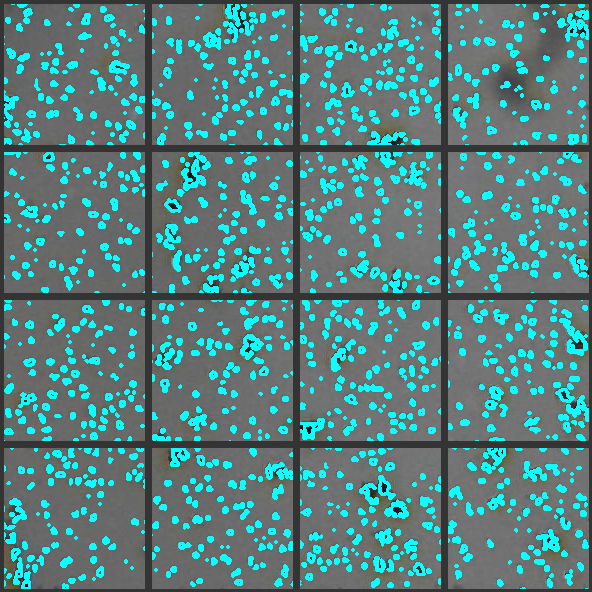

In [ ]:
print((v2_2_contourdetector('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/debug_cellcount_bad/20210714_113705.jpg')[0]))

cv2_imshow(v2_2_contourdetector('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/debug_cellcount_bad/20210714_113705.jpg')[1])

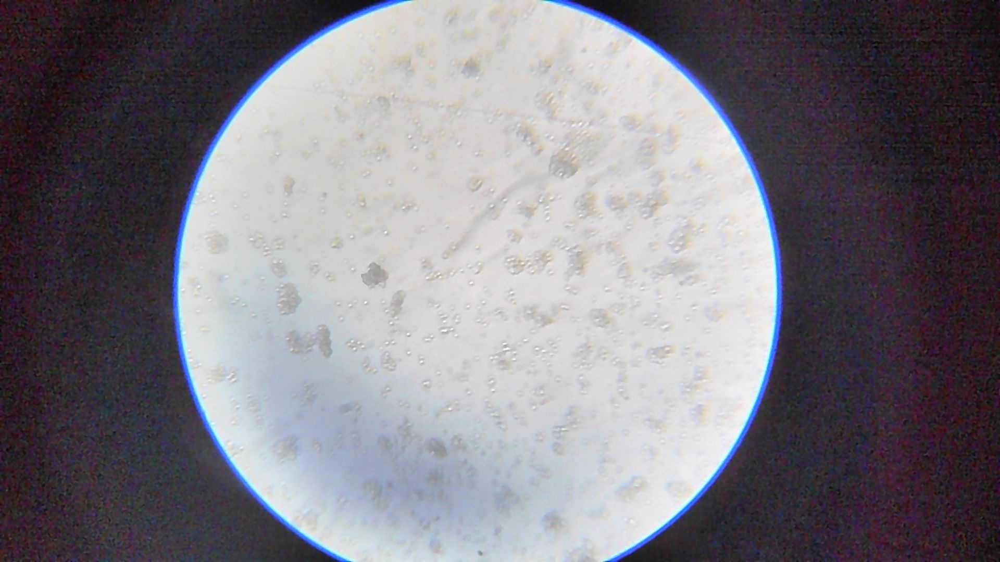

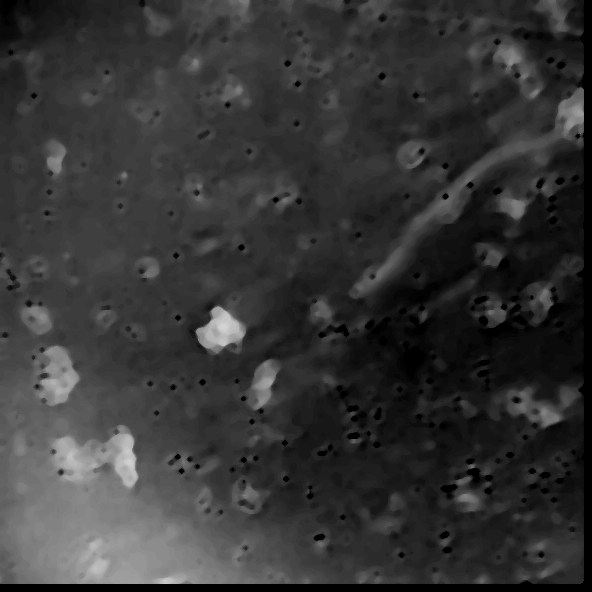

1024


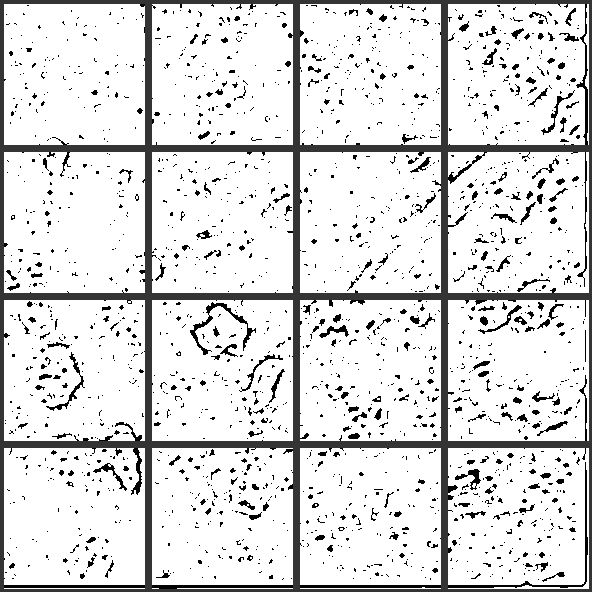

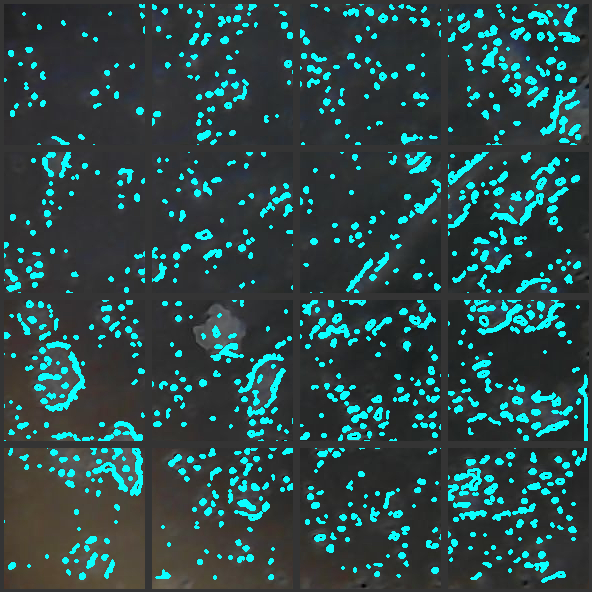

"f, axarr = plt.subplots(nrows=1,ncols=4)\nplt.sca(axarr[0]); \nplt.imshow(original); plt.title('Original')\nplt.sca(axarr[1]); \nplt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')\nplt.sca(axarr[2]); \nplt.imshow(255-thresh); plt.title('Adaptive Thresholding')\nplt.sca(axarr[3]); \nplt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')\n#plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/webcam_gridlines.png',bbox_inches = 'tight')\nfig = plt.gcf()\nfig.set_size_inches(24, 16)\n#fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/v2.2_adaptivethresholding/21july_autofocus_unsharp_dilate2.png', dpi= 100,bbox_inches = 'tight')\nplt.show()"

In [ ]:
"""V2.3 Make Adaptive Thresholding Methods Contour Detector Resilient against Blurred Images while Making Performance okay for prev images"""
# TODO figure out how to make alpha mask and make gridlines translucent
# 5 pixels for line thickness
# 148 pixels per 0.25mm / 592 pixels per 1mm

image = cv2.imread('/content/gdrive/MyDrive/CY2003_MnT/cell_pictures_and_videos/webcam_photos/21_july_autofocus/20210721_114144_X1.0Y0.0Z0.0.jpg')
cv2_imshow(image)
image = unsharp_mask(image)
image = cv2.bitwise_not(image) # obtained by inverting image using bitwise_not and saving 
original = image.copy()
height, width, channels = image.shape

y=200
x=500
h=592
w=592

# use numpy slicing to execute the crop
image = image[y:y+h, x:x+w]
kernel = np.ones((2,2),np.uint8)
#image = cv2.medianBlur(image, 5)
sure_bg = cv2.erode(image,kernel,iterations = 1) # apply erosion filter

# add bottom and right outermost gridline to ignore cells on these lines
cv2.line(sure_bg, (0,sure_bg.shape[0]), (sure_bg.shape[1],sure_bg.shape[0]), color = (0,0,0), thickness = 15) # bottom
cv2.line(sure_bg, (sure_bg.shape[1],sure_bg.shape[0]), (sure_bg.shape[1],0), color = (0,0,0), thickness = 15)

gray = cv2.cvtColor(sure_bg, cv2.COLOR_BGR2GRAY) # convert to grayscale for thresholding
gray = unsharp_mask(gray)
gray = unsharp_mask(gray)
gray = unsharp_mask(gray)
cv2_imshow(gray)
thresh = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)
kernel2 = np.ones((2,2),np.uint8)
thresh = cv2.dilate(thresh,kernel2,iterations = 1) # apply erosion again to smooth cells so the cell wall is smooth
#cv2_imshow(thresh)
cnts, hierarchy = cv2.findContours(255-thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = [cnts[i] for i in range(len(cnts)) if hierarchy[0][i][2] == -1] # count contours with no child contours only

white_dots = [] 

for c in cnts:
    area = cv2.contourArea(c)
    if 300 > area > 0:
        cv2.drawContours(image, [c], -1, (255, 255, 12), 2)
        white_dots.append(c)

print(len(white_dots))

cv2.rectangle(original, (x, y), (x+w, y+h), (52, 52, 52), 5)
drawBasicGridOriginal(original, 148, (52,52,52),x, x+w,y, y+h)

drawBasicGrid(image, 148, (52, 52, 52))

drawBasicGrid(sure_bg, 148,(52, 52, 52) )

drawBasicGrid(thresh, 148, (52,52,52))
#cv2_imshow(thresh)
cv2_imshow(image)

"""f, axarr = plt.subplots(nrows=1,ncols=4)
plt.sca(axarr[0]); 
plt.imshow(original); plt.title('Original')
plt.sca(axarr[1]); 
plt.imshow(sure_bg); plt.title('Image Sharpen and Erosion')
plt.sca(axarr[2]); 
plt.imshow(255-thresh); plt.title('Adaptive Thresholding')
plt.sca(axarr[3]); 
plt.imshow(image); plt.title(f'Detected Contours with Cell Count:{len(white_dots)}')
#plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/webcam_gridlines.png',bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(24, 16)
#fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/blobs_n_contours/v2.2_adaptivethresholding/21july_autofocus_unsharp_dilate2.png', dpi= 100,bbox_inches = 'tight')
plt.show()"""

# Rough Working // Code 

In [ ]:
# Contour detection via HSV 
# not v sustainable need to know HSV lower and upper range through trial and error using colour picker (may work if cell images are done with consistent lighting??)
import cv2
import numpy as np
import math

image = cv2.imread("/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1contrast.png")
original = image.copy()
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
cv2.imwrite("/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1hsv.png",hsv)
#plt.imshow(hsv)

hsv_lower = np.array([120,60,40])
hsv_upper = np.array([190,210,210])
mask = cv2.inRange(hsv, hsv_lower, hsv_upper)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
opening = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
close = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=2)

cnts = cv2.findContours(close, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

minimum_area = 8
average_cell_area = 200
connected_cell_area = 800
cells = 0
for c in cnts:
    area = cv2.contourArea(c)
    print(area)
    if area > minimum_area:
        cv2.drawContours(original, [c], -1, (36,255,12), 2)
        if area > connected_cell_area:
            cells += math.ceil(area / average_cell_area)
        else:
            cells += 1
print('Cells: {}'.format(cells))
cv2_imshow(close)
cv2_imshow(original)

In [ ]:
 def bandpass_filter(image, radius, w, n=1):
    """
         Bandpass filter function
         :param image: input image
         :param radius: distance from the center of the band to the origin of the frequency plane
         :param w: bandwidth
         :param n: order
         :return: filtering result
    """
         # Fourier transform the image, fft is a three-dimensional array, fft[:, :, 0] is the real part, fft[:, :, 1] is the imaginary part
    fft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
         # Centralize fft, the generated dshift is still a three-dimensional array
    dshift = np.fft.fftshift(fft)
 
         # Get the center pixel
    rows, cols = image.shape[:2]
    mid_row, mid_col = int(rows / 2), int(cols / 2)
 
         # Build mask, 256 bits, two channels
    mask = np.zeros((rows, cols, 2), np.float32)
    for i in range(0, rows):
        for j in range(0, cols):
                         # Calculate the distance from (i, j) to the center
            d = math.sqrt(pow(i - mid_row, 2) + pow(j - mid_col, 2))
            if radius - w / 2 < d < radius + w / 2:
                mask[i, j, 0] = mask[i, j, 1] = 1
            else:
                mask[i, j, 0] = mask[i, j, 1] = 0
 
         # Multiply the Fourier transform result by a mask
    fft_filtering = dshift * np.float32(mask)
         # Inverse Fourier transform
    ishift = np.fft.ifftshift(fft_filtering)
    image_filtering = cv2.idft(ishift)
    image_filtering = cv2.magnitude(image_filtering[:, :, 0], image_filtering[:, :, 1])
         # Normalize the inverse transform results (generally normalize the last step of image processing, except in special cases)
    cv2.normalize(image_filtering, image_filtering, 0, 1, cv2.NORM_MINMAX)
    return image_filtering


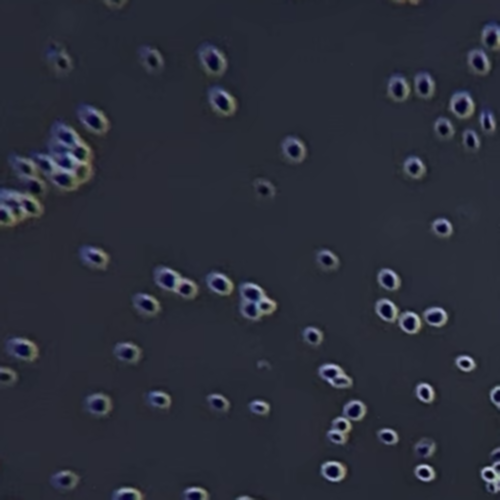

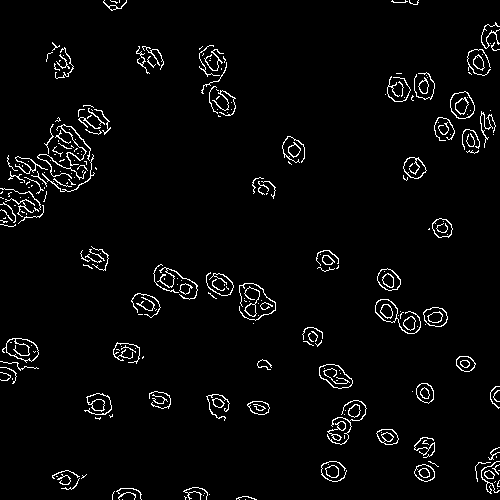

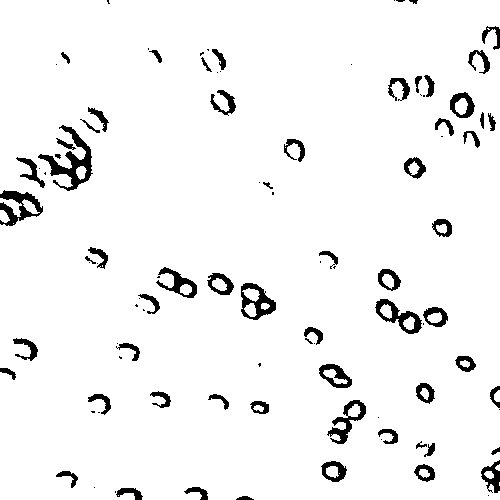

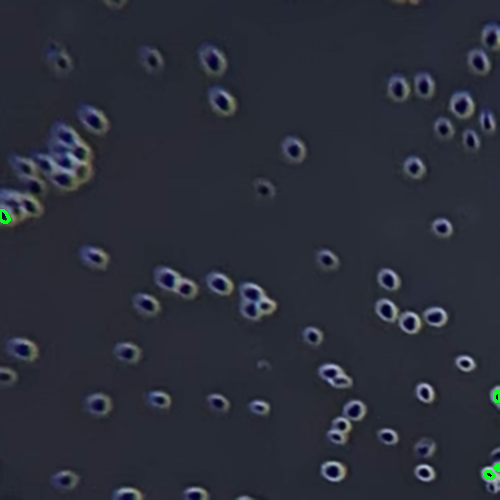

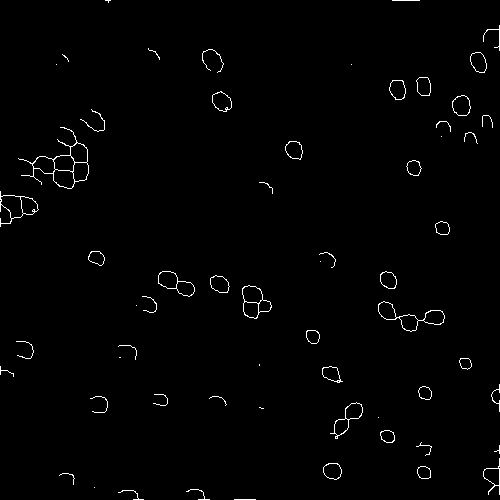

In [ ]:
"""Experimenting"""
img = cv2.imread("/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1.png")
imaging =  cv2.imread("/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1.png",0)
img = cv2.bitwise_not(img)
img = cv2.GaussianBlur(img, (5,5,), 0)
cv2_imshow(img)
a_component = img[:,:,1]
edged = cv2.Canny(a_component, 10, 50)
cv2_imshow(edged)
ret, thresh = cv2.threshold(imaging, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU) # apply otsu threshold
cv2_imshow(thresh)

cnts, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
min_area = 4
max_area = 100
for cnt in cnts:        
    area = cv2.contourArea(cnt)         
    if min_area <area < max_area: 
      cv2.drawContours(img, [cnt], -1, (36,255,12), 2) 

#cv2.drawContours(img, cnts, -1, (0,255,0), 3)
cv2_imshow(img)
#fig = plt.gcf()
#fig.set_size_inches(24, 16)
#plt.show()

img1 = cv2.imread("/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1.png", cv2.IMREAD_GRAYSCALE)
_, img1 = cv2.threshold(img1, 128, 255, cv2.THRESH_OTSU + cv2.THRESH_BINARY_INV)
kernel = np.ones((5,5),np.uint8)
img1 = cv2.dilate(img1,kernel,iterations = 1) 
img1 = cv2.ximgproc.thinning(img1)
cv2_imshow(img1)


Obtained threshold:  182.0
[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


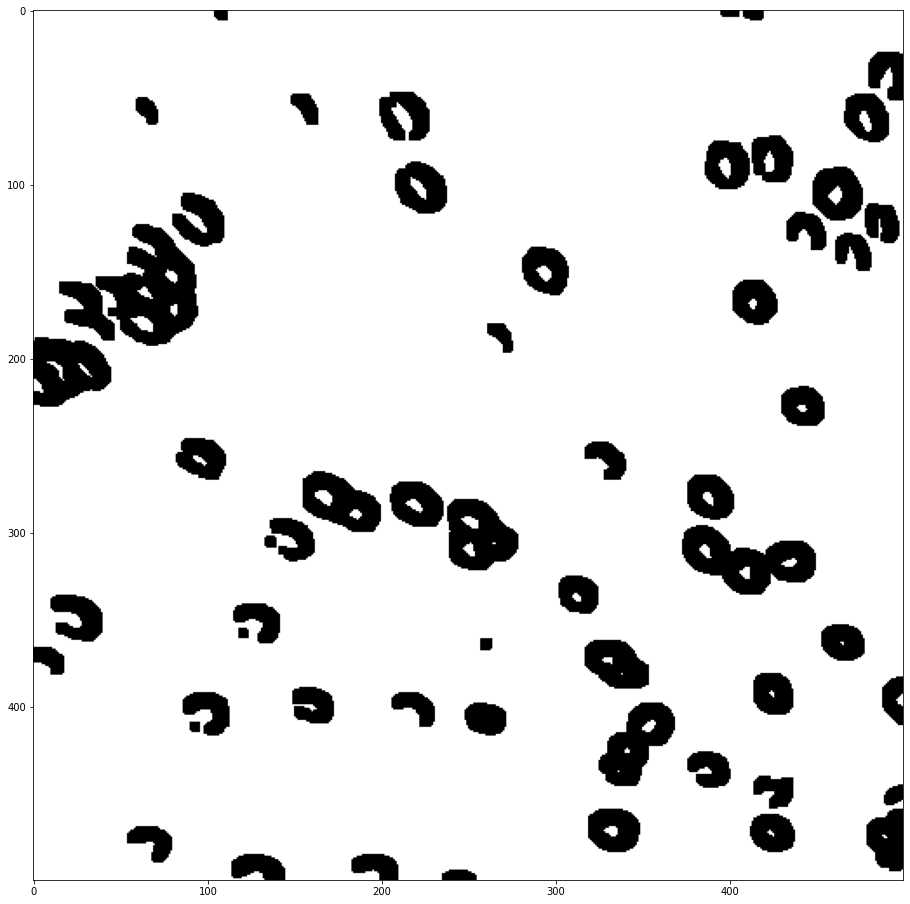

"f, axarr = plt.subplots(nrows=1,ncols=5)\nplt.sca(axarr[0]); \nplt.imshow(image_result); plt.title('Otsu Thresholding')\nplt.sca(axarr[1]); \nplt.imshow(erosion); plt.title('Erosion')\nplt.sca(axarr[2]); \nplt.imshow(dilation); plt.title('Dilation')\nplt.sca(axarr[3]); \nplt.imshow(opening); plt.title('Opening')\nplt.sca(axarr[4]); \nplt.imshow(closing); plt.title('Closing')\n#plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/preprocessing/{}.png'.format(job_name),bbox_inches = 'tight')\nfig = plt.gcf()\nfig.set_size_inches(24, 16)\n#fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/preprocessing/{}_big.png'.format(job_name), dpi= 100,bbox_inches = 'tight')\nplt.show()"

In [ ]:
image = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1.png', 0) # convert to grayscale
# add gaussian blur to image
image = cv2.GaussianBlur(image,(5,5),0)
otsu_threshold, image_result = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) # apply otsu's thresholding
#plt.imshow(image_result, cmap = 'gray')
print("Obtained threshold: ", otsu_threshold)

# do dilation or erosion filter
# or do both in sequence (opening == erosion followed by dilation; closing == dilation followed by erosion)

"""
Dilation:
increases size of objects
fills the holes and broken areas
"""
kernel = np.ones((5,5),np.uint8)
print(kernel)
erosion = cv2.erode(image_result,kernel,iterations = 1)
plt.imshow(erosion, cmap = 'gray')
"""
Erosion:
decreases size of objects
removes the small anomalies
"""
dilation = cv2.dilate(image_result,kernel,iterations = 1)
erosion_dilation = cv2.dilate(erosion, kernel, iterations = 1)
#plt.imshow(dilation)

# segment cells that are touching

opening = cv2.morphologyEx(image_result, cv2.MORPH_OPEN, kernel)
#plt.imshow(opening)

closing = cv2.morphologyEx(image_result, cv2.MORPH_CLOSE, kernel)
#plt.imshow(closing)
#plt.imshow(erosion)
fig = plt.gcf()
fig.set_size_inches(24, 16)
plt.show()

"""f, axarr = plt.subplots(nrows=1,ncols=5)
plt.sca(axarr[0]); 
plt.imshow(image_result); plt.title('Otsu Thresholding')
plt.sca(axarr[1]); 
plt.imshow(erosion); plt.title('Erosion')
plt.sca(axarr[2]); 
plt.imshow(dilation); plt.title('Dilation')
plt.sca(axarr[3]); 
plt.imshow(opening); plt.title('Opening')
plt.sca(axarr[4]); 
plt.imshow(closing); plt.title('Closing')
#plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/preprocessing/{}.png'.format(job_name),bbox_inches = 'tight')
fig = plt.gcf()
fig.set_size_inches(24, 16)
#fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/preprocessing/{}_big.png'.format(job_name), dpi= 100,bbox_inches = 'tight')
plt.show()"""

# otsu thresholding + erosion is the best i guess
# TODO: Experiment with kernels
# https://stackoverflow.com/questions/45070004/iterations-vs-kernel-size-in-morphological-operations-opencv

# Understanding Morphological Operations Visually: Erosion, Dilation, Opening and Closing 

* Plotting to discern differences between operations for understanding.

Obtained threshold:  177.0
[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


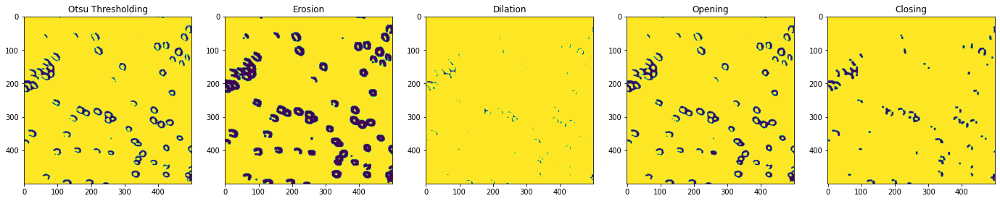

In [ ]:
# preprocessing

#image = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/heic_to_png/1.png', 0) # convert to grayscale
image = cv2.imread('/content/gdrive/MyDrive/cy2003_cellcounting/training_data_12jun/cropped1.png',0)
otsu_threshold, image_result = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) # apply otsu's thresholding
#plt.imshow(image_result)
print("Obtained threshold: ", otsu_threshold)

# do dilation or erosion filter
# or do both in sequence (opening == erosion followed by dilation; closing == dilation followed by erosion)

"""
Dilation:
increases size of objects
fills the holes and broken areas
"""
kernel = np.ones((5,5),np.uint8)
print(kernel)
erosion = cv2.erode(image_result,kernel,iterations = 1)
#plt.imshow(erosion)
"""
Erosion:
decreases size of objects
removes the small anomalies
"""
dilation = cv2.dilate(image_result,kernel,iterations = 1)
#plt.imshow(dilation)

opening = cv2.morphologyEx(image_result, cv2.MORPH_OPEN, kernel)
#plt.imshow(opening)

closing = cv2.morphologyEx(image_result, cv2.MORPH_CLOSE, kernel)
#plt.imshow(closing)

f, axarr = plt.subplots(nrows=1,ncols=5)
plt.sca(axarr[0]); 
plt.imshow(image_result); plt.title('Otsu Thresholding')
plt.sca(axarr[1]); 
plt.imshow(erosion); plt.title('Erosion')
plt.sca(axarr[2]); 
plt.imshow(dilation); plt.title('Dilation')
plt.sca(axarr[3]); 
plt.imshow(opening); plt.title('Opening')
plt.sca(axarr[4]); 
plt.imshow(closing); plt.title('Closing')
fig = plt.gcf()
fig.set_size_inches(24, 16)
plt.show()
#plt.savefig('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/preprocessing/{}.png'.format(job_name),bbox_inches = 'tight')
#fig.savefig('/content/gdrive/MyDrive/CY2003_MnT/mlstuff/preprocessing/{}_big.png'.format(job_name), dpi= 100,bbox_inches = 'tight')

# Transfer Learning: VGG Model
* We decided to focus on creating our own model.

In [ ]:
# test with vgg model https://keras.io/api/applications/vgg/
import tensorflow as tf
from keras.applications.vgg16 import VGG16
from tf.keras.layers import Input
from tf.keras.optimizers import Adam
from tf.keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping

batch_size = 32
learning_rate = 0.0001
size = (?, ?)
shape = (?, ?, 3)
epochs = 30
baseModel = VGG16(include_top = False, input_tensor = Input(shape = shape))

for layer in baseModel.layers:
  layer.trainable = False

# i.e. load vgg and add layers over it:
# https://keras.io/guides/transfer_learning/ guide

model = Sequential()
model.add(baseModel)
model.add(AveragePooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(512, activation="relu"))
model.add(Dropout(0.5))
model.add(Dense(50, activation="relu"))
model.add(Dropout(0.5)) # this is a fairly high dropout tbh
# model.add(Dense(1, activation='sigmoid')) # this is a binary classifier which is not rly what we want
model.add(Dense(6, activation = 'softmax')) # should give the probability of each class

model.compile(loss="binary_crossentropy", metrics=["accuracy"], \
                  optimizer=Adam(learning_rate=learning_rate))

earlystop = EarlyStopping(monitor='val_loss', patience=5, mode='auto')
tensorboard = TensorBoard(log_dir=os.path.join("logs", model_name))
checkpoint = ModelCheckpoint(os.path.join("results", f"{model_name}" + f"-size-{size[0]}" + \
                                             f"-bs-{bs}" + f"-lr-{lr}.h5"),    \
                                              monitor='val_loss',save_best_only=True, verbose=1)
# Train model
r = model.fit(training_dataset, epochs=epochs, validation_data= validation_data, batch_size=bs, callbacks=[earlystop, tensorboard, checkpoint], shuffle=True)


SyntaxError: ignored

In [ ]:
# plot the loss
import matplotlib.pyplot as plt
plt.plot(r.history['loss'], label='train loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.legend()
plt.show()
#plt.savefig('LossVal_loss')

# plot the accuracy
plt.plot(r.history['accuracy'], label='train acc')
plt.plot(r.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
#plt.savefig('AccVal_acc')

In [ ]:
model.save('cellcount_vgg16.h5')

In [ ]:
# testing 

# get cell count by length of list from output of train model


# Transfer Learning: U Net Model


*   Initialise dataset and load images and masks (diff image formats for easy sorting)
* We decided to focus on creating our own model.



In [ ]:
# use Mask-RCNN to create masks
# https://colab.research.google.com/github/navidyou/Mask-RCNN-implementation-for-cell-nucleus-detection-executable-on-google-colab-/blob/master/mask_RCNN_cell_nucleus_google_colab.ipynb

# Need to spent time training another model sigh 
# or can manually label

In [ ]:
#@title Store processed images and masks
import os 
import cv2
import numpy as np
from PIL import Image

folderPathInDrive = "CY2003_MnT/cell_pictures_and_videos/pictures" #@param {type:"string"}
lst   = os.listdir('/content/gdrive/MyDrive/' + folderPathInDrive)
print(lst)


img = [f for f in os.listdir('/content/gdrive/MyDrive/' + folderPathInDrive) if f.endswith('.jpg')]
mask = [f for f in os.listdir('/content/gdrive/MyDrive/' + folderPathInDrive) if f.endswith('.png')]

img.sort()
mask.sort()
img = img[:1000]
masks = mask[:1000]

# preprocessing images and masks
y = np.zeros((1000, 28,28), dtype=np.float32)
X = np.zeros((1000,224, 224, 1), dtype=np.float32)

for file in img:
  index = img.index(i)
  dir_img = os.path.join('/content/gdrive/MyDrive/' + folderPathInDrive, i)
  img = Image.open(dir_img)
  img = img.resize((224, 224))
  img = np.reshape(img.convert('L'), (224,224,1)) 
  X[n] = img
  mask = masks[index]
  dir_mask = os.path.join('/content/gdrive/MyDrive/' + folderPathInDrive, mask)
  mask_img = cv2.imread(dir_mask)
  mask_img = (mask!=2)*1.0  
  mask_img = cv2.resize(mask, (28, 28))
  mask_img = 1.0*(mask[:,:,0]>0.2)
  y[n] = mask

# get image channel
import cv
import ndarray.ndim as ndim from np

img = cv.imread('') 
channels = 0 if img.ndim == 2 else img.shape[2]

['20210602143946155.tif', '20210602143946155 (1).tif', 'PXL_20210602_091028050.jpg', 'PXL_20210602_091027293.MP.jpg', 'PXL_20210602_090745333.jpg', 'PXL_20210602_090742514.jpg', 'PXL_20210602_090301261.jpg', 'PXL_20210602_090259648.jpg', 'PXL_20210602_090256790.MP.jpg', 'PXL_20210602_085717835.jpg', 'PXL_20210602_085711542.jpg', 'PXL_20210602_085709705.jpg', 'PXL_20210602_085458578.jpg', 'PXL_20210602_085402485.jpg', 'PXL_20210602_085359668.jpg', 'PXL_20210602_085342221.jpg', 'PXL_20210602_085704296.jpg', 'IMG_3193.HEIC', 'IMG_3156.HEIC', 'IMG_3171.HEIC', 'IMG_3191.HEIC', 'IMG_3155.HEIC', 'IMG_3190.HEIC', 'IMG_3169.HEIC', 'IMG_3170.HEIC', 'IMG_3181.HEIC', 'IMG_3180.HEIC', 'IMG_3176.HEIC', 'IMG_3157.HEIC', 'IMG_3160.HEIC', 'IMG_3177.HEIC', 'IMG_3165.HEIC', 'IMG_3167.HEIC', 'IMG_3159.HEIC', 'IMG_3164.HEIC', 'IMG_3162.HEIC', 'IMG_3168.HEIC', 'IMG_3188.HEIC', 'IMG_3174.HEIC', 'IMG_3185.HEIC', 'IMG_3178.HEIC', 'IMG_3175.HEIC', 'IMG_3172.HEIC', 'IMG_3186.HEIC', 'IMG_3184.HEIC', 'IMG_3192.HEI

In [ ]:
https://github.com/HelmholtzAI-Consultants-Munich/Automatic-Cell-Counter

Trying out different UNet models online


In [ ]:
# Load image and masks

"""
- folder
  |--images
      |--.tif
      |--...
  |--masks
     |--.png
     |--...
  |--metadata
     |--validation.txt // filenames for validation images
     |--training.txt // filenames for training images
     |--testing.txt // filenames for testing images 
"""     
DATASET_PATH = ""
TRAINING_PATH = os.path.join(DATASET_PATH, "metadata", "validation.txt")
VALIDATION_PATH = os.path.join(DATASET_PATH, "metadata", "training.txt")
TEST_PATH = os.path.join(DATASET_PATH, "metadata", "test.txt")

training_filenames = open(TRAINING_PATH, "r").read().split("\n")[:-1]
validation_filenames = open(VALIDATION_PATH, "r").read().split("\n")[:-1]
test_filenames = open(TEST_PATH, "r").read().split("\n")[:-1]

training_paths = [filename[:-1] for filename in training_filenames]
validation_paths = [filename[:-1] for filename in validation_filenames]
test_paths = [filename[:-1] for filename in test_filenames]

training_filename_iterator = itertools.cycle(training_paths)

training_image = dt.LoadImage(
    filename=training_filename_iterator,
    path=lambda filename: os.path.join(DATASET_PATH, "images", filename) + ".tif"
)

training_mask = dt.LoadImage(
    filename=training_image.filename,
    path=lambda filename: os.path.join(DATASET_PATH, "masks", filename) + ".png"
)



In [ ]:
# make sure images are multiples of 16, needed by network archi
cropper = dt.CropToMultiplesOf(16)

training_dataset += cropper
validation_dataset += cropper
test_dataset += cropper

In [ ]:
# Making the model
!pip install deeptrack
import os
import numpy as np
import matplotlib.pyplot as plt
import itertools
import skimage
import skimage.morphology
import scipy

import deeptrack as dt
IMAGE_SIZE = 256

import tensorflow as tf
import tensorflow.keras.backend as K
import tensorflow.keras.losses as losses
import keras
eps = 1e-6

loss_weights = [4, 1]

# Standard MAE
def mae(T, P):
    return K.mean(K.abs(T - P)) 

# Difference in mean
def count_error(T, P):
    return K.mean(K.abs(K.mean(T - P, axis=(1, 2)))) 

# Weighted sum of loss
def total_loss(T, P):
    return mae(T, P) * loss_weights[0] + count_error(T, P) * loss_weights[1]


model = dt.models.UNet(
    input_shape=(None, None, 1),
    number_of_outputs=1,
    steps_per_pooling=2,
    output_activation="relu",
    loss=total_loss,
    optimizer=keras.optimizers.Adam(lr=0.0002, amsgrad=True, beta_1=0.5),
    metrics=[mae, count_error],
)
    
model.summary()

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 1 160         input_1[0][0]                    
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 1 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 1 2320        activation[0][0]                 
______________________________________________________________________________________________

In [ ]:
# Training
from deeptrack.extras import datasets

TRAIN_MODEL = True

if TRAIN_MODEL:
    from tensorflow.keras.callbacks import EarlyStopping


    generator = dt.generators.ContinuousGenerator(
        synthetic_dataset, 
        get_label, 
        get_image, 
        batch_size=16, 
        min_data_size=1000, 
        max_data_size=1001
    )

    validation_set = [validation_dataset.update().resolve() for _ in range(len(validation_paths))]
    validation_data = [get_image(v_tuple) for v_tuple in validation_set]
    validation_labels = [get_label(v_tuple) for v_tuple in validation_set]

    with generator:
        h = model.fit(
            generator,
            steps_per_epoch=4,
            epochs=1000,
            workers=0,
            validation_data=(
                np.array(validation_data),
                np.array(validation_labels)
            ), 
            callbacks = [
                EarlyStopping("val_count_error", patience=50, restore_best_weights=True)
            ] 
        )
else:
    path = datasets.load_model("CellCounting")
    model.load_weights(path)

NameError: ignored

In [ ]:
# Prediction Vs Actual

test_set = [test_dataset.update().resolve() for _ in range(len(test_paths))]
test_data = [get_image(v_tuple) for v_tuple in test_set]
test_labels = [get_label(v_tuple) for v_tuple in test_set]

predictions = model.predict(np.array(test_data))
for image, mask, prediction in zip(test_data, test_labels, predictions):
    plt.figure(figsize=(15, 5))
    
    plt.subplot(131)
    plt.imshow(image[:, :, 0], cmap="gray")
    plt.title("I count {0} out of {1} cells".format(
        np.ceil(np.sum(prediction[:, :, 0]) / NORM_FACTOR),
        np.ceil(np.sum(mask[:, :, 0]) / NORM_FACTOR)
    ))
    
    plt.subplot(132)
    plt.imshow(mask[:, :, 0], cmap="gray")
    
    plt.subplot(133)
    plt.imshow(prediction[:, :, 0], cmap="gray")
    plt.show()
